In [164]:
%load_ext autoreload
from retro_branching.rewards import DualBound, PrimalBound, PrimalDualGap, PrimalDualGapFrac, DualBoundFrac, PrimalDualBoundFracSum, PrimalBoundFrac, PrimalBoundGapFrac, DualBoundGapFrac, NormalisedLPGain, OptimalRetroTrajectoryNormalisedLPGain, RetroBranching, BinarySolved, RetroBranchingMCTSBackprop
from retro_branching.observations import NodeBipariteWithSolutionLabels, NodeBipariteWith28VariableFeatures, NodeBipariteWith45VariableFeatures, NodeBipariteWith40VariableFeatures, NodeBipariteWith43VariableFeatures, NodeBipariteWith24VariableFeatures, NodeBipariteWith29VariableFeatures, NodeBipariteWith37VariableFeatures, NodeBipariteWithCustomFeatures
from retro_branching.agents import StrongBranchingAgent, PseudocostBranchingAgent, RandomAgent
from retro_branching.utils import seed_stochastic_modules_globally

import ecole

import networkx as nx
from networkx.drawing.nx_pydot import graphviz_layout
from networkx.algorithms.shortest_paths.generic import shortest_path
from networkx.algorithms.traversal.depth_first_search import dfs_tree
import matplotlib.pyplot as plt
import seaborn as sns

import math
from ordered_set import OrderedSet
import copy
from collections import defaultdict

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [10]:
%autoreload

default_scip_params = {'separating/maxrounds': 0,
                       'separating/maxroundsroot': 0,
                       'separating/maxcuts': 0,
                       'separating/maxcutsroot': 0,
                       'presolving/maxrounds': 0,
                       'presolving/maxrestarts': 0,
                       'propagating/maxrounds':0,
                       'propagating/maxroundsroot':0,
                       'lp/initalgorithm':'d',
                       'lp/resolvealgorithm':'d',
                       'limits/time': 3600}

gasse_2019_scip_params = {'separating/maxrounds': 0, # separate (cut) only at root node
                          'presolving/maxrestarts': 0, # disable solver restarts
                          'limits/time': 3600} # solver time limit

ml4co_item_placement_scip_params = {'presolving/maxrounds': 0}
ml4co_load_balancing_scip_params = {'separating/maxrounds': 0,
                                    'separating/maxroundsroot': 0}

ml4co_anonymous_scip_params = {}

dfs_scip_params = {
                   'separating/maxrounds': 0, # separate (cut) only at root node
                   'presolving/maxrestarts': 0, # disable solver restarts
                   'limits/time': 3600, # solver time limit
                   
                   'nodeselection/dfs/stdpriority': 1073741823,
                   'nodeselection/dfs/memsavepriority': 536870911,
                   
#                    'nodeselection/restartdfs/stdpriority': 1073741823,
#                    'nodeselection/restartdfs/memsavepriority': 536870911,
#                    'nodeselection/restartdfs/selectbestfreq': 0,
    
                    # RestartDFS is different from DFS, disable
                   'nodeselection/restartdfs/stdpriority': -536870912,
                   'nodeselection/restartdfs/memsavepriority': -536870912,
                   'nodeselection/restartdfs/selectbestfreq': 0,
                   
                   'nodeselection/bfs/stdpriority': -536870912,
                   'nodeselection/bfs/memsavepriority': -536870912,
                   
                   'nodeselection/breadthfirst/stdpriority': -536870912,
                   'nodeselection/breadthfirst/memsavepriority': -536870912,
                   
                   'nodeselection/estimate/stdpriority': -536870912,
                   'nodeselection/estimate/memsavepriority': -536870912,
                   
                   'nodeselection/hybridestim/stdpriority': -536870912,
                   'nodeselection/hybridestim/memsavepriority': -536870912,
                   
                   'nodeselection/uct/stdpriority': -536870912,
                   'nodeselection/uct/memsavepriority': -536870912,
                   
                  }

In [192]:
%autoreload

class EcoleBranching(ecole.environment.Branching):
    def __init__(
        self,
        observation_function='default',
        information_function='default',
        reward_function='default',
        scip_params='default',
        pseudo_candidates=False,
    ):
        '''
        Args:
            observation_function (dict, str): Custom dict or one of: 'default',
                'label_solution_values', '28_var_features', '45_var_features',
                '40_var_features'
            scip_params (dict, str): Custom dictionary or one of: 'default', 
                'ml4co_item_placement', 'ml4co_load_balancing', 'ml4co_anonymous',
                'gasse_2019', 'dfs' (see https://www.scipopt.org/doc/html/PARAMETERS.php)
        '''
        # save string names so easy to initialise new environments
        if type(observation_function) == str:
            self.str_observation_function = observation_function
        else:
            self.str_observation_function = None
        if type(information_function) == str:
            self.str_information_function = information_function
        else:
            self.str_information_function = None
        if type(reward_function) == str:
            self.str_reward_function = reward_function
        else:
            self.str_reward_function = None
        if type(scip_params) == str:
            self.str_scip_params = scip_params
        else:
            self.str_scip_params = None

        self.pseudo_candidates = pseudo_candidates

        # init functions from strings if needed
        if reward_function == 'default':
            reward_function = ({
                     'num_nodes': -ecole.reward.NNodes(),
                     'lp_iterations': -ecole.reward.LpIterations(),
                     # 'primal_integral': -ecole.reward.PrimalIntegral(),
                     # 'dual_integral': ecole.reward.DualIntegral(),
                     # 'primal_dual_integral': -ecole.reward.PrimalDualIntegral(),
                     'solving_time': -ecole.reward.SolvingTime(),
                     # 'primal_bound': PrimalBound(sense=-1),
                     # 'dual_bound': DualBound(sense=-1),
                     # 'primal_dual_gap': PrimalDualGap(),
                     # 'dual_bound_frac': DualBoundFrac(sense=-1),
                     # 'primal_bound_frac': PrimalBoundFrac(sense=-1),
                     # 'primal_dual_gap_frac': PrimalDualGapFrac(),
                     # 'primal_dual_bound_frac_sum': PrimalDualBoundFracSum(),
                     # 'primal_bound_gap_frac': PrimalBoundGapFrac(sense=-1),
                     'dual_bound_gap_frac': DualBoundGapFrac(sense=-1),
                     # 'normalised_lp_gain': NormalisedLPGain(normaliser='init_primal_bound', transform_with_log=False),
                     # 'optimal_retro_trajectory_normalised_lp_gain': OptimalRetroTrajectoryNormalisedLPGain(normaliser='init_primal_bound'),
                     # 'retro_branching': RetroBranching(normaliser='init_primal_bound', min_subtree_depth=2, retro_trajectory_construction='deepest', remove_nonoptimal_fathomed_leaves=False),
                     # 'retro_binary_fathomed': RetroBranching(use_binary_sparse_rewards=True, normaliser='init_primal_bound', min_subtree_depth=2, retro_trajectory_construction='deepest', remove_nonoptimal_fathomed_leaves=False),
                     # 'optimal_subtree_binary_sparse_rewards': RetroBranching(only_return_optimal_trajectory=True, use_binary_sparse_rewards=True, normaliser='init_primal_bound', min_subtree_depth=2, retro_trajectory_construction='deepest', remove_nonoptimal_fathomed_leaves=False),
                     # 'retro_branching':
                     # RetroBranching(force_include_optimal_trajectory=False,
                         # force_include_branching_fathomed_transitions=True,
                         # only_return_optimal_trajectory=False,
                         # only_use_leaves_closed_by_brancher_as_terminal_nodes=False,
                         # set_score_as_subtree_size=False,
                         # use_binary_sparse_rewards=False,
                         # normaliser='init_primal_bound', 
                         # min_subtree_depth=1,
                         # retro_trajectory_construction='max_leaf_lp_gain',
                         # remove_nonoptimal_fathomed_leaves=False,
                         # use_mean_return_rooted_at_node=False,
                         # use_sum_return_rooted_at_node=False,
                         # transform_with_log=False),
                     'retro_binary_fathomed':
                     RetroBranching(
                         force_include_optimal_trajectory=False,
                         force_include_last_visited_trajectory=True,
                         force_include_branching_fathomed_transitions=True,
                         only_return_optimal_trajectory=False,
                         only_use_leaves_closed_by_brancher_as_terminal_nodes=False,
                         set_score_as_subtree_size=False,
                         use_binary_sparse_rewards=True,
                         normaliser='init_primal_bound', 
                         min_subtree_depth=1,
                         retro_trajectory_construction='max_leaf_lp_gain',
                         remove_nonoptimal_fathomed_leaves=False,
                         use_mean_return_rooted_at_node=False,
                         use_sum_return_rooted_at_node=False,
                         transform_with_log=False),
                     # 'retro_branching_mcts_backprop': RetroBranchingMCTSBackprop(use_binary_sparse_rewards=True, normaliser='init_primal_bound', transform_with_log=False, use_retro_trajectories=True, leaf_type='all'),
                     # 'binary_solved': BinarySolved(solved=0, not_solved=-1),
                 })
            
        if information_function == 'default':
            information_function=({
                     'num_nodes': ecole.reward.NNodes().cumsum(),
                     'lp_iterations': ecole.reward.LpIterations().cumsum(),
                     'solving_time': ecole.reward.SolvingTime().cumsum(),
                 })
            
        if observation_function == 'default':    
            observation_function = (ecole.observation.NodeBipartite())
        elif observation_function == 'label_solution_values':
            presolve_env = EcoleConfiguring()
            observation_function = (NodeBipariteWithSolutionLabels(presolve_env=presolve_env))
        elif observation_function == '24_var_features':
            observation_function = (NodeBipariteWith24VariableFeatures())
        elif observation_function == '28_var_features':
            observation_function = (NodeBipariteWith28VariableFeatures())
        elif observation_function == '45_var_features':
            observation_function = (NodeBipariteWith45VariableFeatures())
        elif observation_function == '40_var_features':
            observation_function = (NodeBipariteWith40VariableFeatures())
        elif observation_function == '43_var_features':
            observation_function = (NodeBipariteWith43VariableFeatures())
        elif observation_function == '29_var_features':
            observation_function = (NodeBipariteWith29VariableFeatures())
        elif observation_function == '37_var_features':
            observation_function = (NodeBipariteWith37VariableFeatures())
        elif observation_function == 'custom_var_features':
            observation_function = (NodeBipariteWithCustomFeatures())
            
        if scip_params == 'default':
            scip_params = default_scip_params
        elif scip_params == 'ml4co_item_placement':
            scip_params = ml4co_item_placement_scip_params
        elif scip_params == 'ml4co_load_balancing':
            scip_params = ml4co_load_balancing_scip_params 
        elif scip_params == 'ml4co_anonymous':
            scip_params = ml4co_anonymous_scip_params 
        elif scip_params == 'gasse_2019':
            scip_params = gasse_2019_scip_params
        elif scip_params == 'dfs':
            scip_params = dfs_scip_params
        
        super(EcoleBranching, self).__init__(
            observation_function=observation_function,
            information_function=information_function,
            reward_function=reward_function,
            scip_params=scip_params,
            pseudo_candidates=pseudo_candidates,
        )


In [258]:
%autoreload


class SearchTree:
    '''
    Tracks SCIP search tree. Call SearchTree.update_tree(ecole.Model) each
    time the ecole environment (and therefore the ecole.Model) is updated.

    N.B. SCIP does not store nodes which were pruned, infeasible, outside
    the search tree's optimality bounds, or which node was optimal, therefore these nodes will not be
    stored in the SearchTree. This is why m.getNTotalNodes() (the total number
    of nodes processed by SCIP) will likely be more than the number of nodes in
    the search tree when an instance is solved.
    '''
    def __init__(self, model):       
        self.tree = nx.DiGraph()
        
        self.tree.graph['root_node'] = None
        self.tree.graph['visited_nodes'] = []
        self.tree.graph['visited_node_ids'] = OrderedSet()
        
        m = model.as_pyscipopt()
        if m.getCurrentNode() is not None:

            self.tree.graph['optimum_nodes'] = [m.getCurrentNode()]
            self.tree.graph['optimum_node_ids'] = OrderedSet([m.getCurrentNode().getNumber()])
            self.init_primal_bound = m.getPrimalbound()
            self.tree.graph['incumbent_primal_bound'] = self.init_primal_bound

            self.tree.graph['fathomed_nodes'] = []
            self.tree.graph['fathomed_node_ids'] = OrderedSet()

            self.prev_primal_bound = None
            self.prev_node_id = None

            self.step_idx = 0

            self.update_tree(model)
            
        else:
            # instance was pre-solved
            pass
            
    def update_tree(self, model):
        '''
        Call this method after each update to the ecole environment. Pass
        the updated ecole.Model, and the B&B tree tracker will be updated accordingly.
        '''
        m = model.as_pyscipopt()
                
        # get current node (i.e. next node to be branched at)
        _curr_node = m.getCurrentNode()
        if _curr_node is not None:
            self.curr_node_id = _curr_node.getNumber()
        else:
            # branching finished, no curr node
            self.curr_node_id = None
        
        if len(self.tree.graph['visited_node_ids']) >= 1:
            self.prev_node_id, self.prev_node = self.tree.graph['visited_node_ids'][-1], self.tree.graph['visited_nodes'][-1]
            
            # check if previous branching at previous node changed global primal bound. If so, set previous node as optimum
            if m.getPrimalbound() < self.tree.graph['incumbent_primal_bound']:
                # branching at previous node led to finding new incumbent solution
                self.tree.graph['optimum_nodes'].append(self.prev_node)
                self.tree.graph['optimum_node_ids'].add(self.prev_node_id)
                self.tree.graph['incumbent_primal_bound'] = m.getPrimalbound()
            
        self.curr_node = {self.curr_node_id: _curr_node}
        if self.curr_node_id is not None:
            if self.curr_node_id not in self.tree.graph['visited_node_ids']:
                self._add_nodes(self.curr_node)
                self.tree.graph['visited_nodes'].append(self.curr_node)
                self.tree.graph['visited_node_ids'].add(self.curr_node_id)
                self.tree.nodes[self.curr_node_id]['step_visited'] = self.step_idx
        
        if self.curr_node_id is not None:
            _parent_node = list(self.curr_node.values())[0].getParent()
            if _parent_node is not None:
                parent_node_id = _parent_node.getNumber()
            else:
                # curr node is root node
                parent_node_id = None
            self.parent_node = {parent_node_id: _parent_node}
        else:
            self.parent_node = {None: None} 
            
        # add open nodes to tree
        open_leaves, open_children, open_siblings = m.getOpenNodes()
        self.open_leaves = {node.getNumber(): node  for node in open_leaves}
        self.open_children = {node.getNumber(): node for node in open_children}
        self.open_siblings = {node.getNumber(): node for node in open_siblings}
        
        self._add_nodes(self.open_leaves)
        self._add_nodes(self.open_children)
        self._add_nodes(self.open_siblings)
        
        # check if previous branching at previous node led to fathoming
        if len(self.tree.graph['visited_node_ids']) > 2 or self.curr_node_id is None:
            if self.curr_node_id is not None:
                # in above code, have added current node to visited node ids, therefore prev node is at idx=-2
                self.prev_node_id, self.prev_node = self.tree.graph['visited_node_ids'][-2], self.tree.graph['visited_nodes'][-2]
            else:
                # branching finished, previous node was fathomed
                self.prev_node_id, self.prev_node = self.tree.graph['visited_node_ids'][-1], self.tree.graph['visited_nodes'][-1]
            if len(list(self.tree.successors(self.prev_node_id))) == 0 and self.prev_node_id != self.curr_node_id:
                # branching at previous node led to fathoming
                self.tree.graph['fathomed_nodes'].append(self.prev_node)
                self.tree.graph['fathomed_node_ids'].add(self.prev_node_id)

        self.step_idx += 1

    def _add_nodes(self, nodes, parent_node_id=None):
        '''Adds nodes if not already in tree.'''
        for node_id, node in nodes.items():
            if node_id not in self.tree:
                # add node
                self.tree.add_node(node_id,
                                   _id=node_id,
                                   lower_bound=node.getLowerbound())

                # add edge
                _parent_node = node.getParent()
                if _parent_node is not None:
                    if parent_node_id is None:
                        parent_node_id = _parent_node.getNumber()
                    else:
                        # parent node id already given
                        pass
                    self.tree.add_edge(parent_node_id,
                                       node_id)
                else:
                    # is root node, has no parent
                    self.tree.graph['root_node'] = {node_id: node}
                    
    def _get_node_groups(self):
        node_groups = defaultdict(lambda: [])
        for node in self.tree.nodes:
            if node not in self.tree.graph['visited_node_ids'] or self.curr_node_id == node:
                node_groups['Unvisited'].append(node)
            else:
                node_groups['Visited'].append(node)
            if node in self.tree.graph['fathomed_node_ids']:
                node_groups['Fathomed'].append(node)
            if node == self.tree.graph['optimum_node_ids'][-1]:
                node_groups['Incumbent'].append(node)
        return node_groups
                                    
    def render(self,
               unvisited_node_colour='#FFFFFF',
               visited_node_colour='#A7C7E7',
               fathomed_node_colour='#FF6961',
               incumbent_node_colour='#C1E1C1',
               next_node_colour='#FFD700',
               node_edge_colour='#000000',
               use_latex_font=True,
               font_scale=0.75,
               context='paper',
               style='ticks'
              ):
        '''Renders B&B search tree.'''
        if use_latex_font:
            sns.set(rc={'text.usetex': True},
                    font='times')
        sns.set_theme(font_scale=font_scale, context=context, style=style)
        
        group_to_colour = {'Unvisited': unvisited_node_colour,
                           'Visited': visited_node_colour,
                           'Fathomed': fathomed_node_colour,
                           'Incumbent': incumbent_node_colour}
        
        f, ax = plt.subplots()
        
        pos = graphviz_layout(self.tree, prog='dot')

        node_groups = self._get_node_groups()
        for group_label, nodes in node_groups.items():
            nx.draw_networkx_nodes(self.tree,
                                   pos,
                                   nodelist=nodes,
                                   node_color=group_to_colour[group_label],
                                   edgecolors=node_edge_colour,
                                   label=group_label)
            
        if self.curr_node_id is not None:
            nx.draw_networkx_nodes(self.tree,
                                   pos,
                                   nodelist=[self.curr_node_id],
                                   node_color=unvisited_node_colour,
                                   edgecolors=next_node_colour,
                                   linewidths=3,
                                   label='Next')
            num_groups = len(list(node_groups.keys())) + 1
        else:
            num_groups = len(list(node_groups.keys()))
    
        nx.draw_networkx_edges(self.tree,
                               pos)
        
        print(f'num groups: {num_groups}')
        nx.draw_networkx_labels(self.tree, pos, labels={node: node for node in self.tree.nodes})
        plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=num_groups)
        
        plt.show()

In [259]:
class NormalisedLPGain:
    def __init__(self, 
                 use_binary_sparse_rewards=False,
                 normaliser='init_primal_bound', 
                 transform_with_log=False,
                 epsilon=None):
        '''
        Args:
            use_binary_sparse_rewards (bool): If True, rather than LP-gain, will simply
                return a 1 on the step that solves the instance and a 0 on all
                other steps. Implemented this here to save writing another class
                which tracks sub-trees.
            normaliser ('init_primal_bound', 'curr_primal_bound'): What to normalise
                with respect to in the numerator and denominator to calculate
                the per-step normalsed LP gain reward.
            transform_with_log: If True, will transform the reward by doing
                reward = sign(reward) * log(1 + |reward|) -> helps reduce variance
                of reward as in https://arxiv.org/pdf/1704.03732.pdf
            epsilon (None, float): If not None, will set score of nodes which
                were pruned, infeasible, or outside of bounds to epsilon (rather than
                0 if added or rather than not considering at all if never added to tree).
                N.B. epsilon should be a small number e.g. 1e-6. N.B.2. Current
                implementation assumes each branching decision results in 2 child
                nodes (regardless of whether or not SCIP stores these in memory).
        '''
        self.use_binary_sparse_rewards = use_binary_sparse_rewards
        self.normaliser = normaliser
        self.transform_with_log = transform_with_log
        self.epsilon = epsilon

    def before_reset(self, model):
        self.prev_node = None
        self.prev_node_id = None
        self.prev_primal_bound = None
        self.init_primal_bound = None

    def extract(self, model, done):
        m = model.as_pyscipopt()

        if self.prev_node_id is None:
            # not yet started, update prev node for next step
            self.prev_node = m.getCurrentNode()
            self.tree = SearchTree(model)
            if self.prev_node is not None:
                self.prev_node_id = copy.deepcopy(self.prev_node.getNumber())
                self.prev_primal_bound = m.getPrimalbound()
                self.init_primal_bound = m.getPrimalbound()
            return 0

        # update search tree with current model state
        self.tree.update_tree(model)
        
        # collect node stats from children introduced from previous branching decision
        prev_node_lb = self.tree.tree.nodes[self.prev_node_id]['lower_bound']
        prev_node_child_ids = [child for child in self.tree.tree.successors(self.prev_node_id)]
        prev_node_child_lbs = [self.tree.tree.nodes[child]['lower_bound'] for child in prev_node_child_ids]

        # calc reward for previous branching decision
        if len(prev_node_child_lbs) > 0:
            # use child lp gains to retrospectively calculate a score for the previous branching decision
            closed_by_agent = False
            if self.use_binary_sparse_rewards:
                # score = 0
                score = -1
            else:
                score = -1
                for child_node_lb in prev_node_child_lbs:
                    if self.normaliser == 'curr_primal_bound':
                        # use primal bound of step branching action was taken
                        score *= (self.prev_primal_bound - child_node_lb) / (self.prev_primal_bound - prev_node_lb)
                    elif self.normaliser == 'init_primal_bound':
                        # use init primal bound
                        score *= (self.init_primal_bound - child_node_lb) / (self.init_primal_bound - prev_node_lb)
                    else:
                        raise Exception(f'Unrecognised normaliser {self.normaliser}')
                if self.epsilon is not None:
                    # consider child nodes which were never added to search tree by SCIP
                    for _ in range(int(2-len(prev_node_child_lbs))):
                        score *= self.epsilon
        else:
            # previous branching decision led to all child nodes being pruned, infeasible, or outside bounds -> don't punish brancher
            closed_by_agent = True
            if self.use_binary_sparse_rewards:
                # score = 1
                score = 0
            else:
                if self.epsilon is not None:
                    score = -1 * (self.epsilon**2)
                else:
                    score = 0

        # update tree with effect(s) of branching decision
        self.tree.tree.nodes[self.prev_node_id]['score'] = score
        self.tree.tree.nodes[self.prev_node_id]['closed_by_agent'] = closed_by_agent

        if m.getCurrentNode() is not None:
            # update stats for next step
            self.prev_node = m.getCurrentNode()
            self.prev_node_id = copy.deepcopy(self.prev_node.getNumber())
            self.prev_primal_bound = m.getPrimalbound()
        else:
            # instance completed, no current focus node
            pass

        if self.transform_with_log:
            sign = math.copysign(1, score)
            score = sign * math.log(1 + abs(score), 10)

        if score < -1:
            print('Score < -1 found.')
            for node in self.tree.tree.nodes():
                print(f'Node {node} lb: {self.tree.tree.nodes[node]["lower_bound"]}')
            raise Exception()
        
        return score


In [260]:
class RetroBranching:
    def __init__(self, 
                 force_include_optimal_trajectory=True,
                 force_include_last_visited_trajectory=False,
                 force_include_branching_fathomed_transitions=False,
                 only_return_optimal_trajectory=False,
                 only_use_leaves_closed_by_brancher_as_terminal_nodes=False,
                 set_score_as_subtree_size=False,
                 set_terminal_node_score_as_retrospective_subtree_size=False,
                 use_binary_sparse_rewards=False,
                 normaliser='init_primal_bound', 
                 min_subtree_depth=1, 
                 retro_trajectory_construction='deepest',
                 remove_nonoptimal_fathomed_leaves=False,
                 use_mean_return_rooted_at_node=False,
                 use_sum_return_rooted_at_node=False,
                 transform_with_log=False,
                 debug_mode=False):
        '''
        Waits until end of episode to calculate rewards for each step, then retrospectively
        goes back through each step in the episode and calculates reward for that step.
        I.e. reward returned will be None until the end of the episode, at which
        point a dict mapping episode_step_idx for optimal path nodes to reward will be returned.

        The terminal sub-tree will first retrospectively construct an episode from the root node
        to the opimal node (i.e. the 'optimal path') and make this as one episode. Then, it will
        iteratively go through all other nodes in the B&B tree not already included in a retrospective
        sub-tree episode path and construct sub-trees randomly untill all nodes experiences by the agent
        are included in an episode. Will then return a list, where each element in the list is a dict
        mapping the step index in the original episode and the corresponding reward received by the agent.
        
        Args:
            force_include_branching_fathomed_transitions (bool): If True, will include
                a sub-tree episode if the final transition was a sub-tree closed by
                the brancher even if they total episode length is < min_subtree_depth.
            use_binary_sparse_rewards (bool): If True, rather than LP-gain, will simply
                return a 1 on the step that solves the instance and a 0 on all
                other steps. Implemented this here to save writing another class
                which tracks sub-trees.
            normaliser ('init_primal_bound', 'curr_primal_bound'): What to normalise
                with respect to in the numerator and denominator to calculate
                the per-step normalsed LP gain reward.
            min_subtree_depth (int): Minimum depth of sub-tree (i.e. minimum length of sub-tree episode).
            retro_trajectory_construction ('random', 'deepest', 'shortest', 'max_lp_gain', 'min_lp_gain', 'max_leaf_lp_gain', 
                'reverse_visitation_order', 'visitation_order'): Which policy to use when choosing a leaf node as the final 
                node to construct a sub-tree.
            remove_nonoptimal_fathomed_leaves (bool): If True, at end of episode, will remove
                all leaves in tree which were fathomed (had score == 0) except optimal path leaf 
                so that no non-optimal sub-tree will have been fathomed and contain a 
                node/experience with score == 0.
            use_mean_return_rooted_at_node (bool): If True, for each step in a given
                sub-tree episode, rather than just using the original step reward,
                will:
                    1) get the sub-tree rooted at the current node (step)
                    2) get the paths from the sub-tree root to each of its leaves
                    3) sum the reward across each of these paths to get a backprop'd return from the current node
                    4) divide this by the number of these paths to get the mean backprop'd return from the current node
            set_score_as_subtree_size: If True, will set score at each step as being negative size of total sub-tree
                rooted at current node. I.e. if in DFS setting, sub-tree can contain multiple DFS-sub-trees.
            set_terminal_node_score_as_retrospective_subtree_size: If True, will set score at each terminal as being negative size
                of total *retrospectively defined* sub-tree rooted at current node. E.g. if in DFS setting,
                will be size of DFS-sub-tree. This is similar to the reward of Etheve et al. 2020.

        '''
        if use_mean_return_rooted_at_node and use_sum_return_rooted_at_node:
            raise Exception('use_mean_return_rooted_at_node and use_sum_return_rooted_at_node cannot both be True.')
        if force_include_optimal_trajectory and force_include_last_visited_trajectory:
            raise Exception('Cannot have both force_include_optimal_trajectory and force_include_last_visited_trajectory as True.')

        self.force_include_optimal_trajectory = force_include_optimal_trajectory
        self.force_include_last_visited_trajectory = force_include_last_visited_trajectory
        self.force_include_branching_fathomed_transitions = force_include_branching_fathomed_transitions
        self.only_return_optimal_trajectory = only_return_optimal_trajectory
        self.only_use_leaves_closed_by_brancher_as_terminal_nodes = only_use_leaves_closed_by_brancher_as_terminal_nodes
        if not force_include_optimal_trajectory and only_return_optimal_trajectory:
            raise Exception('Must force inclusion of optimal sub-tree if only want to return optimal sub-tree.')
        self.set_score_as_subtree_size = set_score_as_subtree_size
        self.set_terminal_node_score_as_retrospective_subtree_size = set_terminal_node_score_as_retrospective_subtree_size
        self.use_binary_sparse_rewards = use_binary_sparse_rewards
        self.min_subtree_depth = min_subtree_depth
        self.retro_trajectory_construction = retro_trajectory_construction
        self.normalised_lp_gain = NormalisedLPGain(use_binary_sparse_rewards=use_binary_sparse_rewards, 
                                                   normaliser=normaliser) # normalised lp gain reward tracker
        self.remove_nonoptimal_fathomed_leaves = remove_nonoptimal_fathomed_leaves
        self.use_mean_return_rooted_at_node = use_mean_return_rooted_at_node
        self.use_sum_return_rooted_at_node = use_sum_return_rooted_at_node
        self.transform_with_log = transform_with_log
        self.debug_mode = debug_mode

    def before_reset(self, model):
        self.started = False
        self.normalised_lp_gain.before_reset(model)
        
    def get_path_node_scores(self, tree, path):
        if self.use_mean_return_rooted_at_node or self.use_sum_return_rooted_at_node:
            scores = []
            # use mean return from node across all paths as score for each node
            for root_node in path:
                # get sub-tree rooted from this node
                subtree = dfs_tree(tree, root_node)

                # get leaf nodes of sub-tree
                leaf_nodes = [n for n in subtree.nodes() if subtree.out_degree(n) == 0]

                # get paths in sub-tree
                subtree_paths = [shortest_path(subtree, source=root_node, target=leaf_node) for leaf_node in leaf_nodes]

                # get total reward across all paths
                R = 0
                for p in subtree_paths:
                    for n in p:
                        R += tree.nodes[n]['score']

                if self.use_mean_return_rooted_at_node:
                    # get mean return across all paths from current node -> use as node score
                    R /= len(subtree_paths)
                elif self.use_sum_return_rooted_at_node:
                    # already summed
                    pass
                else:
                    raise Exception('Not implemented.')

                scores.append(R)

        else:
            # use original node score as score for each node
            scores = [tree.nodes[node]['score'] for node in path]

        if self.transform_with_log:
            for idx, score in enumerate(scores):
                sign = math.copysign(1, score)
                score = sign * math.log(1 + abs(score), 10)
                scores[idx] = score

        return scores


        
    def conv_path_to_step_idx_reward_map(self, path, check_depth=True):        
        # register which nodes have been directly included in the sub-tree
        for node in path:
            self.nodes_added.add(node)
            
        if check_depth:
            if len(path) < self.min_subtree_depth:
                # subtree not deep enough, do not use episode (but count all nodes as having been added)
                if self.force_include_branching_fathomed_transitions:
                    if self.normalised_lp_gain.tree.tree.nodes[path[-1]]['score'] == 0:
                        # brancher fathomed sub-tree, should include sub-tree even though is less than min_subtree_depth
                        pass
                    else:
                        # brancher did not fathom sub-tree and is less than min_subtree_depth, do not use
                        return None
                else:
                    # sub-tree is less than min_subtree_depth, do not use
                    return None
        
        # get rewards at each step in sub-tree episode
        path_node_rewards = self.get_path_node_scores(self.normalised_lp_gain.tree.tree, path)

        # get episode step indices at which each node in sub-tree was visited
        path_to_step_idx = {node: self.visited_nodes_to_step_idx[node] for node in path}

        # map each path node episode step idx to its corresponding reward
        step_idx_to_reward = {step_idx: r for step_idx, r in zip(list(path_to_step_idx.values()), path_node_rewards)}
        
        return step_idx_to_reward

    def _select_path_in_subtree(self, subtree):
        for root_node in subtree.nodes:
            if subtree.in_degree(root_node) == 0:
                # node is root
                break

        # use a construction method to select a sub-tree episode path through the sub-tree
        if self.retro_trajectory_construction == 'max_lp_gain' or self.retro_trajectory_construction == 'min_lp_gain':
            if self.only_use_leaves_closed_by_brancher_as_terminal_nodes:
                raise Exception('Have not implemented only_use_leaves_closed_by_brancher_as_terminal_nodes for this subtree construction method.')
            # iteratively decide next node in path at each step
            curr_node, path = root_node, [root_node]
            while True:
                # get potential next node(s)
                children = [child for child in subtree.successors(curr_node)]
                if len(children) == 0:
                    # curr node is final leaf node, path complete
                    break
                else:
                    # select next node
                    if self.retro_trajectory_construction == 'max_lp_gain':
                        idx = np.argmax([subtree.nodes[child]['lower_bound'] for child in children])
                    elif self.retro_trajectory_construction == 'min_lp_gain':
                        idx = np.argmin([subtree.nodes[child]['lower_bound'] for child in children])
                    else:
                        raise Exception(f'Unrecognised retro_trajectory_construction {self.retro_trajectory_construction}')
                    curr_node = children[idx]
                    path.append(curr_node)
                
        else:
            # first get leaf nodes and then use construction method to select leaf target for shortest path
            if self.only_use_leaves_closed_by_brancher_as_terminal_nodes:
                leaf_nodes = [node for node in subtree.nodes() if (subtree.out_degree(node) == 0 and subtree.nodes[node]['score'] == 0)]
            else:
                leaf_nodes = [node for node in subtree.nodes() if subtree.out_degree(node) == 0]
            
            if len(leaf_nodes) == 0:
                # could not find any valid path through sub-tree
                return []

            if self.retro_trajectory_construction == 'random':
                # randomly choose leaf node as final node
                final_node = leaf_nodes[random.choice(range(len(leaf_nodes)))]
            elif self.retro_trajectory_construction == 'deepest':
                # choose leaf node which would lead to deepest subtree as final node
                depths = [len(shortest_path(subtree, source=root_node, target=leaf_node)) for leaf_node in leaf_nodes]
                final_node = leaf_nodes[depths.index(max(depths))]
            elif self.retro_trajectory_construction == 'shortest':
                # choose leaf node which would lead to shortest subtree as final node
                depths = [len(shortest_path(subtree, source=root_node, target=leaf_node)) for leaf_node in leaf_nodes]
                final_node = leaf_nodes[depths.index(min(depths))]
            elif self.retro_trajectory_construction == 'max_leaf_lp_gain':
                # choose leaf node which has greatest LP gain as final node
                lp_gains = [subtree.nodes[leaf_node]['lower_bound'] for leaf_node in leaf_nodes]
                final_node = leaf_nodes[lp_gains.index(max(lp_gains))]
            elif self.retro_trajectory_construction == 'reverse_visitation_order':
                step_node_visited = [self.normalised_lp_gain.tree.tree.nodes[leaf_node]['step_visited'] for leaf_node in leaf_nodes]
                final_node = leaf_nodes[step_node_visited.index(max(step_node_visited))]
            elif self.retro_trajectory_construction == 'visitation_order':
                step_node_visited = [self.normalised_lp_gain.tree.tree.nodes[leaf_node]['step_visited'] for leaf_node in leaf_nodes]
                final_node = leaf_nodes[step_node_visited.index(min(step_node_visited))]
            else:
                raise Exception(f'Unrecognised retro_trajectory_construction {self.retro_trajectory_construction}')
            path = shortest_path(self.normalised_lp_gain.tree.tree, source=root_node, target=final_node)

        return path

    def extract(self, model, done):
        # update normalised LP gain tracker
        _ = self.normalised_lp_gain.extract(model, done)

        if not done:
            return None
        else:
            # instance finished, retrospectively create subtree episode paths

            if self.normalised_lp_gain.tree.tree.graph['root_node'] is None:
                # instance was pre-solved
                # if self.use_binary_sparse_rewards:
                    # return [{0: -1}]
                # else:
                    # return [{0: 0}]
                return [{0: 0}]

            # collect sub-tree episodes
            subtrees_step_idx_to_reward = []

            # keep track of which nodes have been added to a sub-tree
            self.nodes_added = set()
            
            if self.debug_mode:
                print('\nB&B tree:')
                print(f'All nodes saved: {self.normalised_lp_gain.tree.tree.nodes()}')
                print(f'Visited nodes: {self.normalised_lp_gain.tree.tree.graph["visited_node_ids"]}')
                self.normalised_lp_gain.tree.render()

            # remove nodes which were never visited by the brancher and therefore do not have a score or next state
            nodes = [node for node in self.normalised_lp_gain.tree.tree.nodes]
            for node in nodes:
                if 'score' not in self.normalised_lp_gain.tree.tree.nodes[node]:
                    self.normalised_lp_gain.tree.tree.remove_node(node)
                    if node in self.normalised_lp_gain.tree.tree.graph['visited_node_ids']:
                        # hack: SCIP sometimes returns large int rather than None node_id when episode finished
                        # since never visited this node (since no score assigned), do not count this node as having been visited when calculating paths below
                        if self.debug_mode:
                            print(f'Removing node {node} since was never visited by brancher.')
                        self.normalised_lp_gain.tree.tree.graph['visited_node_ids'].remove(node)
                        
            if self.only_use_leaves_closed_by_brancher_as_terminal_nodes:
                # remove leaf nodes which were never fathomed by brancher
                nodes = [node for node in self.normalised_lp_gain.tree.tree.nodes]
                for node in nodes:
                    if self.normalised_lp_gain.tree.tree.out_degree(node) == 0 and self.normalised_lp_gain.tree.tree.nodes[node]['score'] != 0:
                        self.normalised_lp_gain.tree.tree.remove_node(node)
                        if node in self.normalised_lp_gain.tree.tree.graph['visited_node_ids']:
                            if self.debug_mode:
                                print(f'Removing leaf node {node} since was never fathomed by brancher.')
                            self.normalised_lp_gain.tree.tree.graph['visited_node_ids'].remove(node)

            # map which nodes were visited at which step in episode
            self.visited_nodes_to_step_idx = {node: idx for idx, node in enumerate(self.normalised_lp_gain.tree.tree.graph['visited_node_ids'])}

            if self.set_score_as_subtree_size:
                for node in self.normalised_lp_gain.tree.tree.nodes():
                    # get sub-tree rooted at node
                    subtree = dfs_tree(self.normalised_lp_gain.tree.tree, node)
                    
                    # set node score as negative length of sub-tree beneath it (not including root node)
                    self.normalised_lp_gain.tree.tree.nodes[node]['score'] = -(len(subtree) - 1)
            
            root_node = list(self.normalised_lp_gain.tree.tree.graph['root_node'].keys())[0]
            if self.force_include_optimal_trajectory:
                # get optimal path
                final_node = self.normalised_lp_gain.tree.tree.graph['optimum_node_id']
                path = shortest_path(self.normalised_lp_gain.tree.tree, source=root_node, target=final_node)
                subtrees_step_idx_to_reward.append(self.conv_path_to_step_idx_reward_map(path, check_depth=False))

                if self.only_return_optimal_trajectory:
                    return subtrees_step_idx_to_reward

                if self.remove_nonoptimal_fathomed_leaves:
                    for node in nodes:
                        if node in self.normalised_lp_gain.tree.tree.nodes.keys():
                            if self.normalised_lp_gain.tree.tree.nodes[node]['score'] == 0 and node != final_node:
                                # node fathomed and not in optimal path, remove
                                self.normalised_lp_gain.tree.tree.remove_node(node)
                                if self.debug_mode:
                                    print(f'Removed non-optimal fathomed leaf node {node}')

            elif self.force_include_last_visited_trajectory:
                # get path to last visited node
                final_node = self.normalised_lp_gain.tree.tree.graph['visited_node_ids'][-1]
                path = shortest_path(self.normalised_lp_gain.tree.tree, source=root_node, target=final_node)
                subtrees_step_idx_to_reward.append(self.conv_path_to_step_idx_reward_map(path, check_depth=False))

            # create sub-tree episodes from remaining B&B nodes visited by agent
            while True:
                # create depth first search sub-trees from nodes still leftover
                nx_subtrees = []
                
                # construct sub-trees containing prospective sub-tree episode(s) from remaining nodes
                if len(self.nodes_added) > 0:
                    for node in self.nodes_added:
                        children = [child for child in self.normalised_lp_gain.tree.tree.successors(node)]
                        for child in children:
                            if child not in self.nodes_added:
                                nx_subtrees.append(dfs_tree(self.normalised_lp_gain.tree.tree, child))
                else:
                    # not yet added any nodes to a sub-tree, whole B&B tree is first 'sub-tree'
                    nx_subtrees.append(dfs_tree(self.normalised_lp_gain.tree.tree, root_node))
                            
                for i, subtree in enumerate(nx_subtrees):
                    # init node attributes for nodes in subtree (since these are not transferred into new subtree by networkx)
                    for node in subtree.nodes:
                        subtree.nodes[node]['score'] = self.normalised_lp_gain.tree.tree.nodes[node]['score']
                        subtree.nodes[node]['lower_bound'] = self.normalised_lp_gain.tree.tree.nodes[node]['lower_bound']

                    # choose episode path through sub-tree
                    path = self._select_path_in_subtree(subtree)
                    
                    if len(path) > 0:
                        # gather rewards in sub-tree
                        subtree_step_idx_to_reward = self.conv_path_to_step_idx_reward_map(path, check_depth=True)
                        if subtree_step_idx_to_reward is not None:
                            if self.set_terminal_node_score_as_retrospective_subtree_size:
                                for counter, step_idx in enumerate(list(subtree_step_idx_to_reward.keys())):
                                    if counter == len(subtree_step_idx_to_reward) - 1:
                                        # terminal step
                                        subtree_step_idx_to_reward[step_idx] = -1 * len(subtree_step_idx_to_reward)
                                    else:
                                        subtree_step_idx_to_reward[step_idx] = 0
                            subtrees_step_idx_to_reward.append(subtree_step_idx_to_reward)
                        else:
                            # subtree was not deep enough to be added
                            pass
                    else:
                        # cannot establish valid path through sub-tree, do not consider nodes in this sub-tree again
                        for node in subtree.nodes():
                            self.nodes_added.add(node)

                if len(nx_subtrees) == 0:
                    # all sub-trees added
                    break
                    
            if self.debug_mode:
                print(f'visited_nodes_to_step_idx: {self.visited_nodes_to_step_idx}')
                step_idx_to_visited_nodes = {val: key for key, val in self.visited_nodes_to_step_idx.items()}
                print(f'step_idx_to_visited_nodes: {step_idx_to_visited_nodes}')
                for i, ep in enumerate(subtrees_step_idx_to_reward):
                    print(f'>>> sub-tree episode {i+1}: {ep}')
                    ep_path = [step_idx_to_visited_nodes[idx] for idx in ep.keys()]
                    print(f'path: {ep_path}')
                    ep_dual_bounds = [self.normalised_lp_gain.tree.tree.nodes[node]['lower_bound'] for node in ep_path]
                    print(f'ep_dual_bounds: {ep_dual_bounds}')
            
            if len(subtrees_step_idx_to_reward) == 0:
                # solved at root so path length < min path length so was never added to subtrees
                return [{0: 0}]
            else:
                return subtrees_step_idx_to_reward


In [265]:
%autoreload


seed = 2 # 1
seed_stochastic_modules_globally(default_seed=seed)

agent = PseudocostBranchingAgent()

env = EcoleBranching(observation_function='default',
                     information_function='default',
                     reward_function='default',
                     scip_params='dfs' # default dfs
                    )
env.seed(seed)

ecole.seed(seed)
instances = ecole.instance.SetCoverGenerator(n_rows=300, n_cols=300, density=0.05) # 200x200seed=1 300x300seed=2

In a DFS setting, next state is always beneath current node unless current node is fathomed. Therefore, unlike in non-DFS setting, any fathomed nodes will be fathomed by the brancher. Can use this as a sanity check: At the end of the episode, check that no fathomed leaf nodes were never not fathomed by the brancher.

num groups: 3


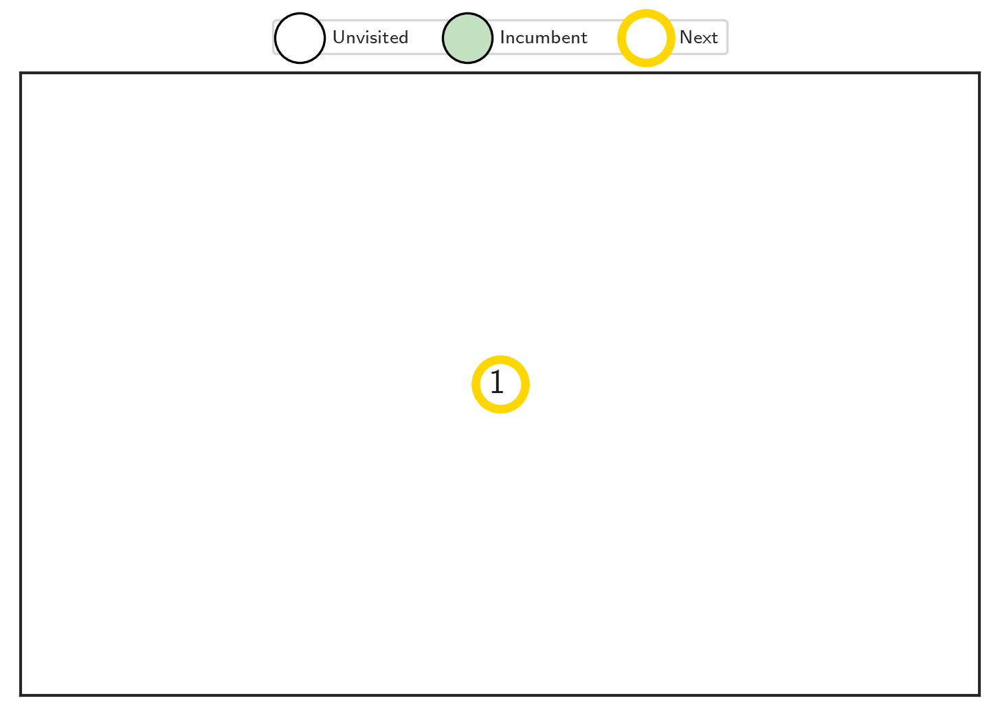

Step 0 | Nodes added: -1.000 | primal bound: 503.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 1 | next_node_id (not yet branched at): 3 | optimum_node_id: 1
Custom reward: None
num groups: 4


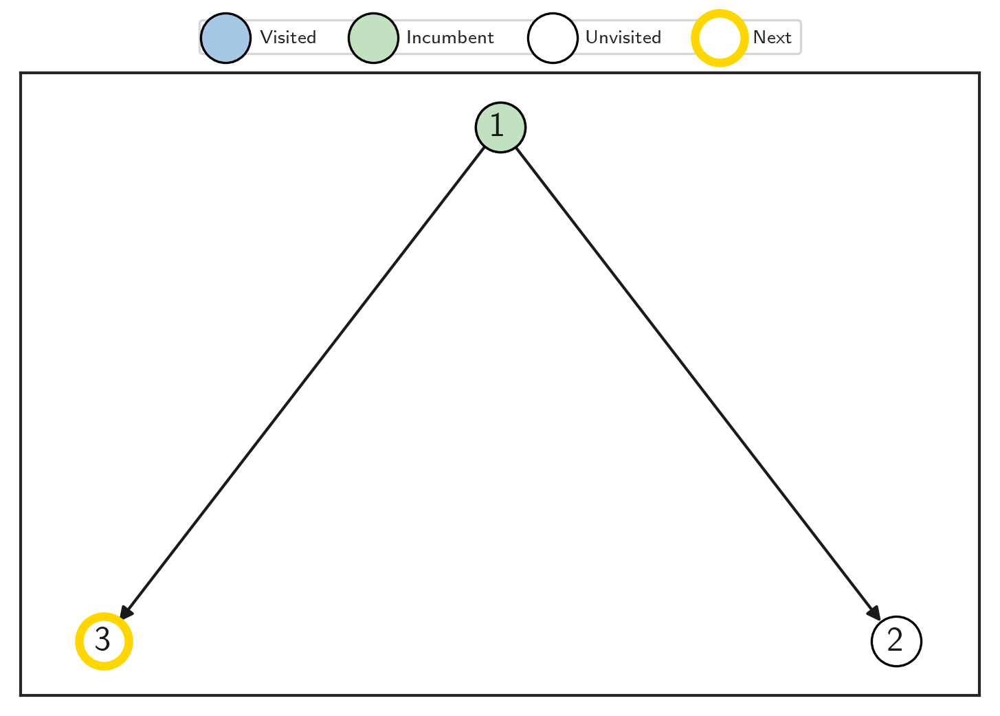


Step 1 | Nodes added: -1.000 | primal bound: 503.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 3 | next_node_id (not yet branched at): 5 | optimum_node_id: 1
Custom reward: None
num groups: 4


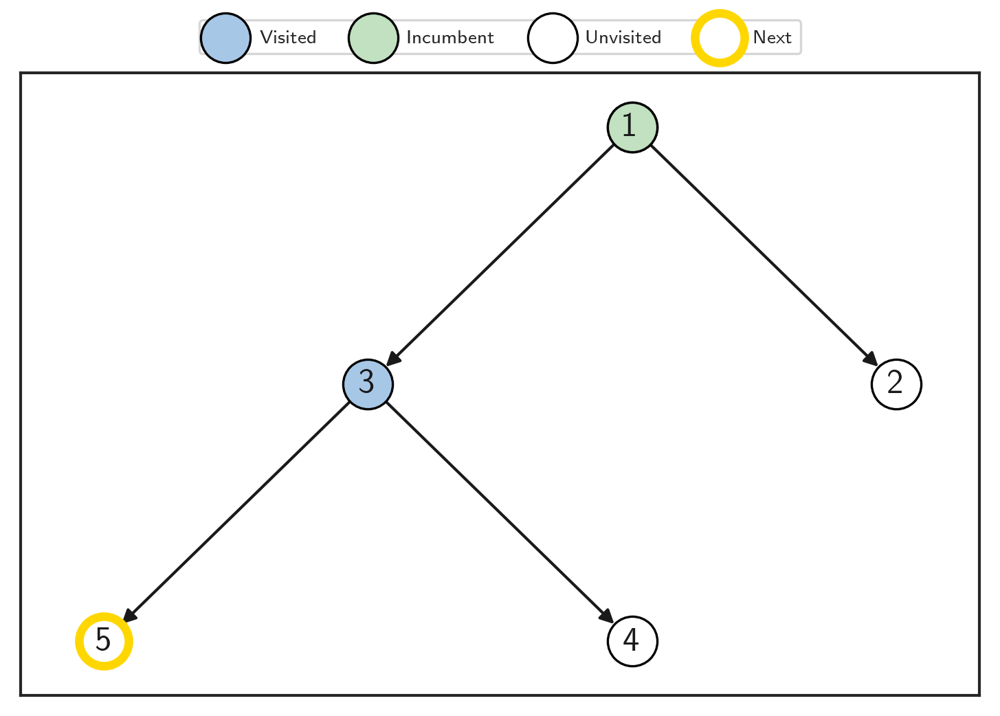


Step 2 | Nodes added: -1.000 | primal bound: 503.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 5 | next_node_id (not yet branched at): 7 | optimum_node_id: 1
Custom reward: None
num groups: 4


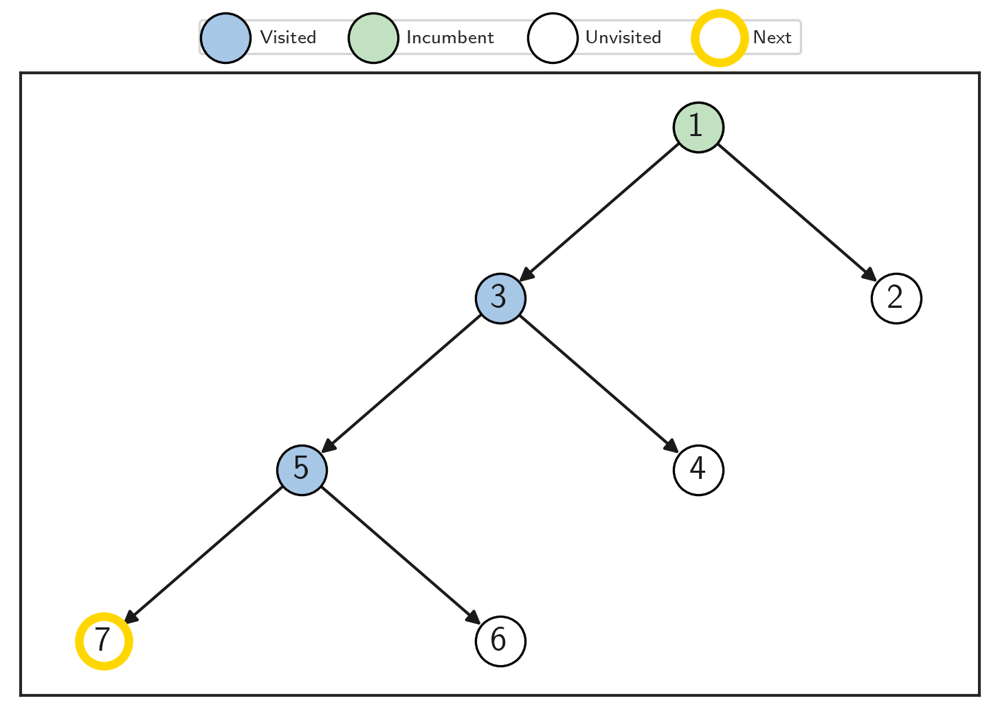


Step 3 | Nodes added: -3.000 | primal bound: 503.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 7 | next_node_id (not yet branched at): 6 | optimum_node_id: 1
Custom reward: None
num groups: 5


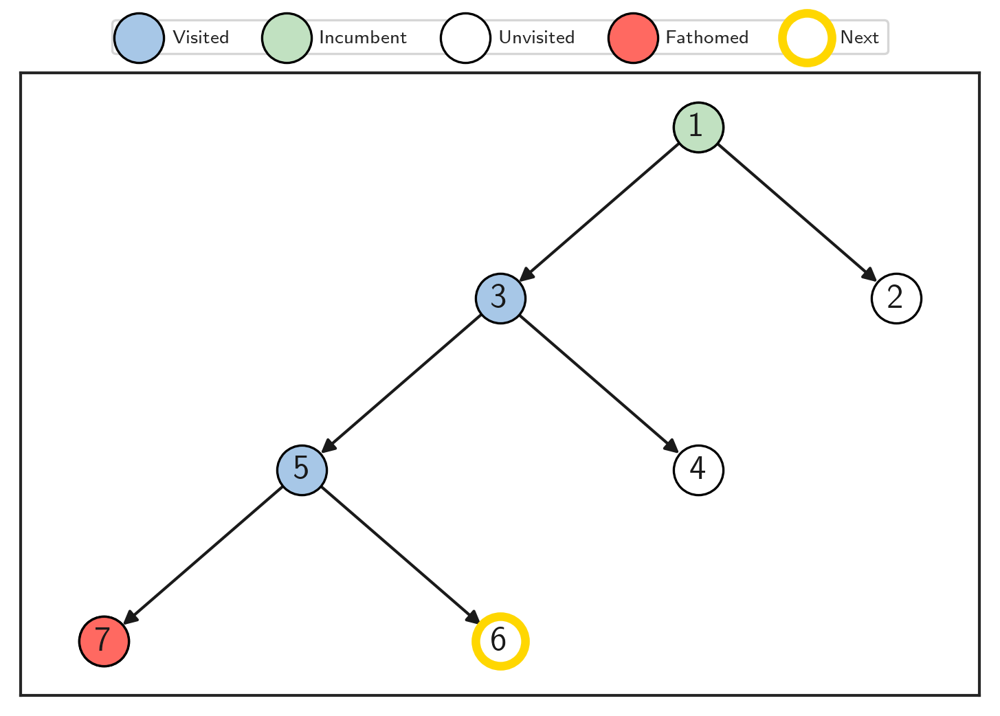


Step 4 | Nodes added: -1.000 | primal bound: 503.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 6 | next_node_id (not yet branched at): 10 | optimum_node_id: 1
Custom reward: None
num groups: 5


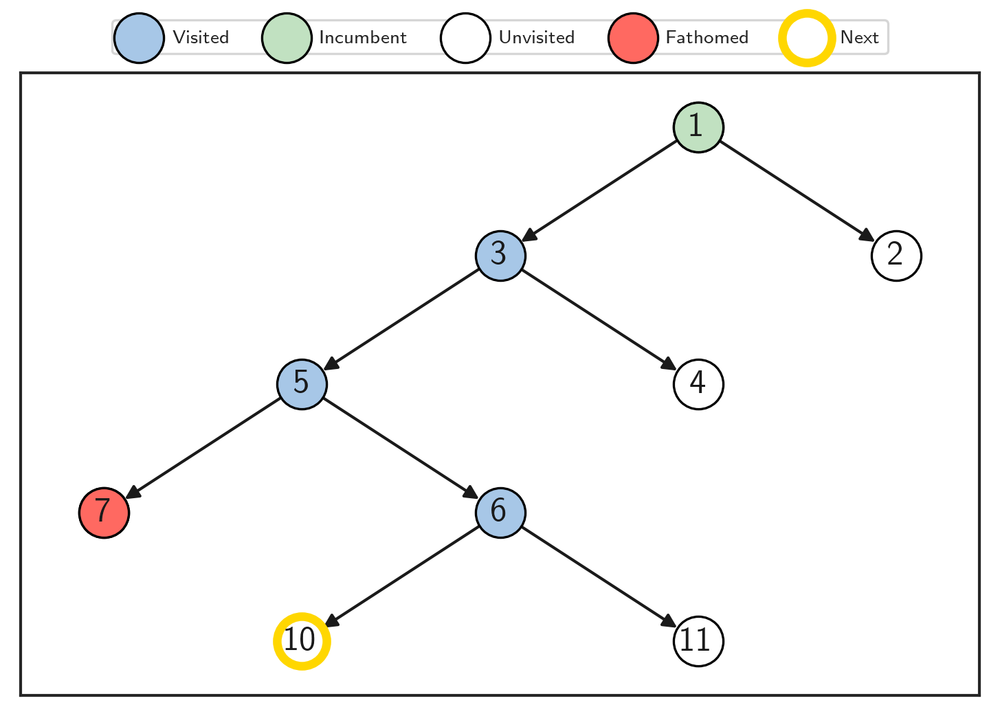


Step 5 | Nodes added: -1.000 | primal bound: 503.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 10 | next_node_id (not yet branched at): 13 | optimum_node_id: 1
Custom reward: None
num groups: 5


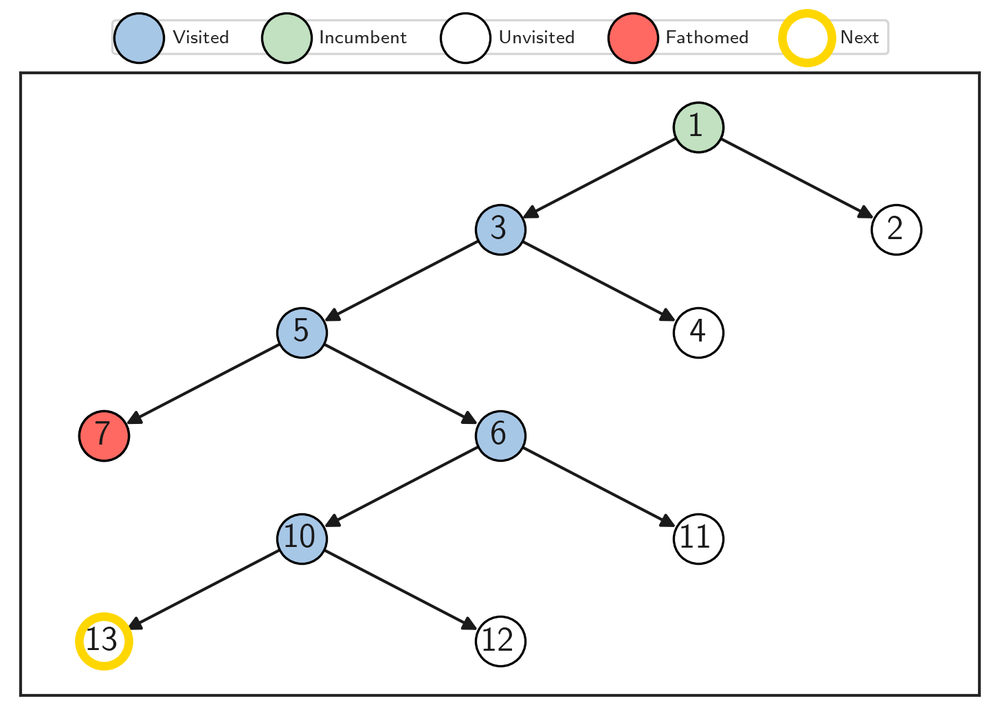


Step 6 | Nodes added: -1.000 | primal bound: 503.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 13 | next_node_id (not yet branched at): 15 | optimum_node_id: 1
Custom reward: None
num groups: 5


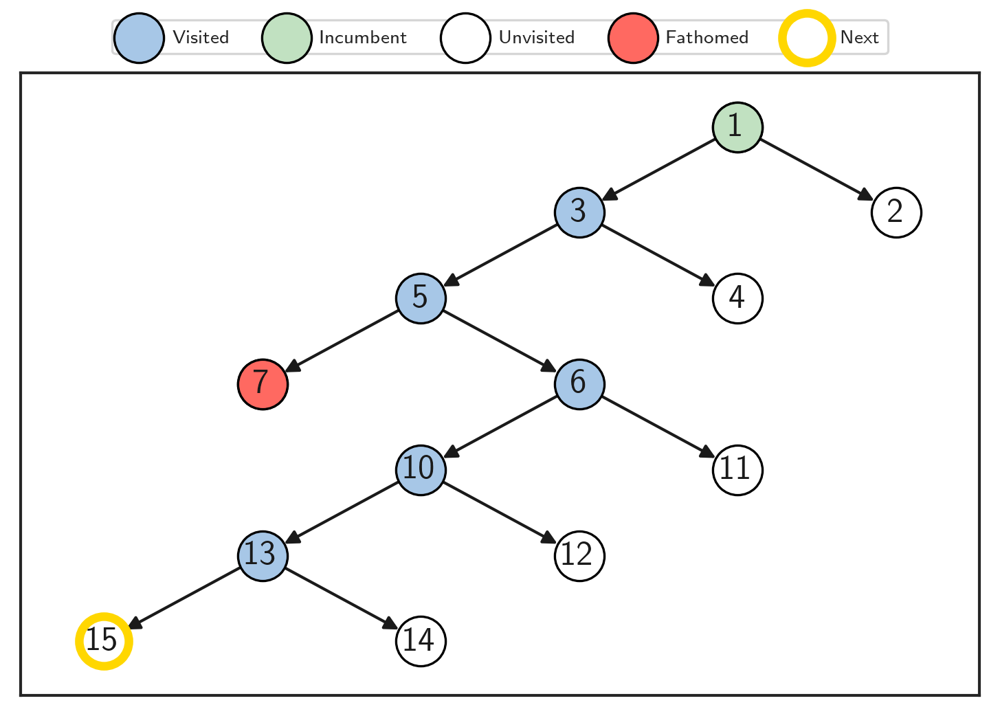


Step 7 | Nodes added: -1.000 | primal bound: 503.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 15 | next_node_id (not yet branched at): 17 | optimum_node_id: 1
Custom reward: None
num groups: 5


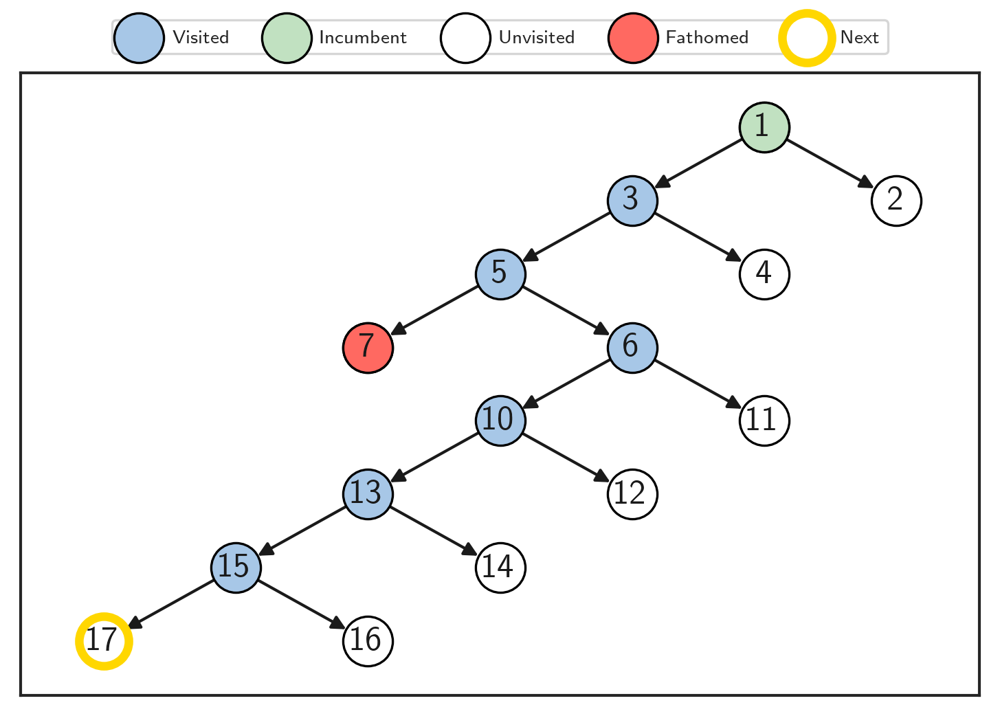


Step 8 | Nodes added: -1.000 | primal bound: 503.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 17 | next_node_id (not yet branched at): 19 | optimum_node_id: 1
Custom reward: None
num groups: 5


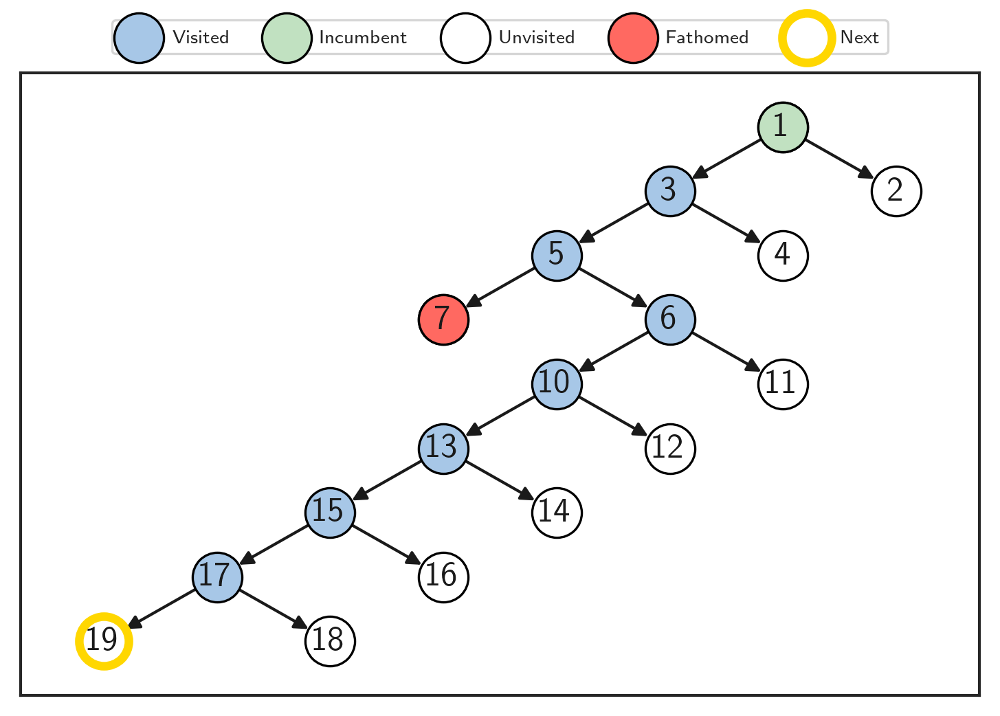


Step 9 | Nodes added: -2.000 | primal bound: 503.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 19 | next_node_id (not yet branched at): 20 | optimum_node_id: 1
Custom reward: None
num groups: 5


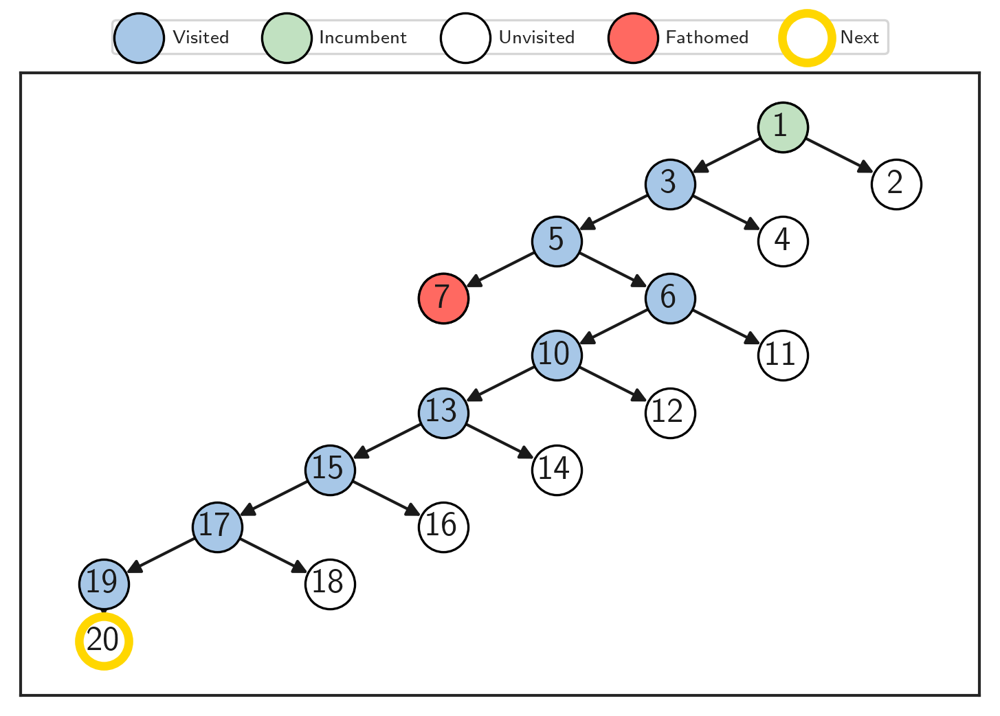


Step 10 | Nodes added: -2.000 | primal bound: 503.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 20 | next_node_id (not yet branched at): 22 | optimum_node_id: 1
Custom reward: None
num groups: 5


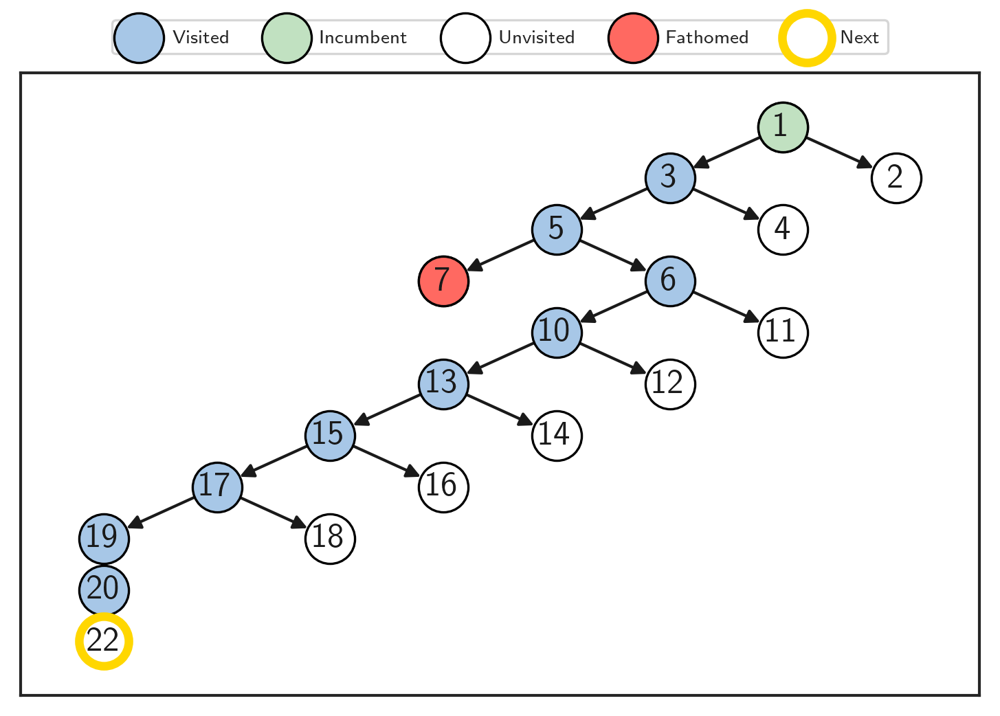


Step 11 | Nodes added: -2.000 | primal bound: 501.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 22 | next_node_id (not yet branched at): 18 | optimum_node_id: 22
Custom reward: None
num groups: 5


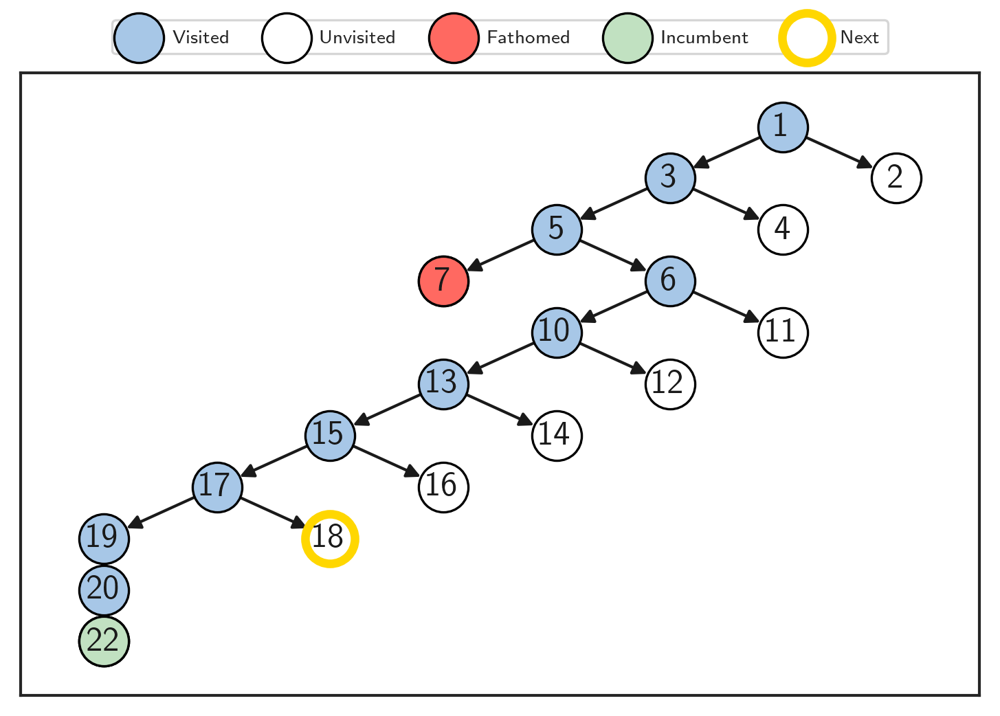


Step 12 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 18 | next_node_id (not yet branched at): 27 | optimum_node_id: 18
Custom reward: None
num groups: 5


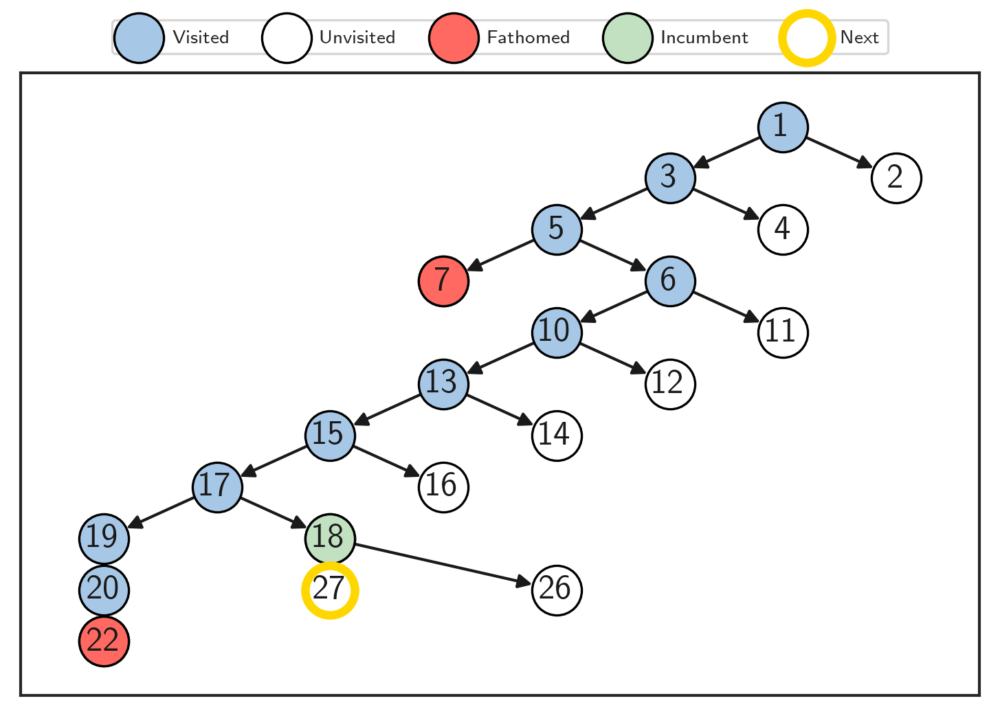


Step 13 | Nodes added: -4.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 27 | next_node_id (not yet branched at): 16 | optimum_node_id: 18
Custom reward: None
num groups: 5


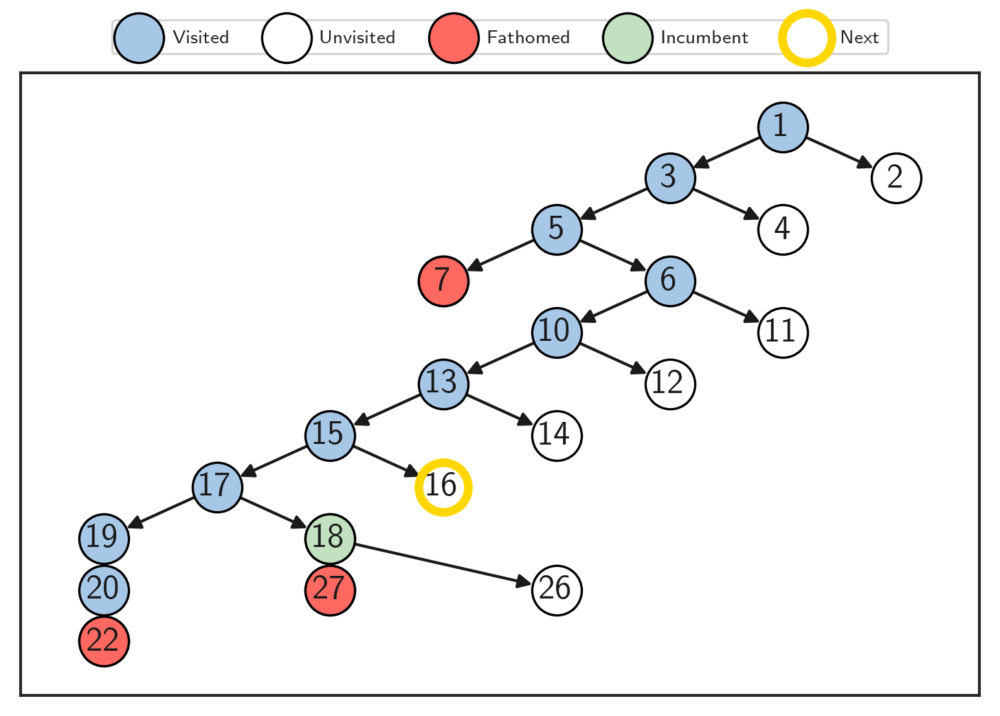


Step 14 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 16 | next_node_id (not yet branched at): 30 | optimum_node_id: 18
Custom reward: None
num groups: 5


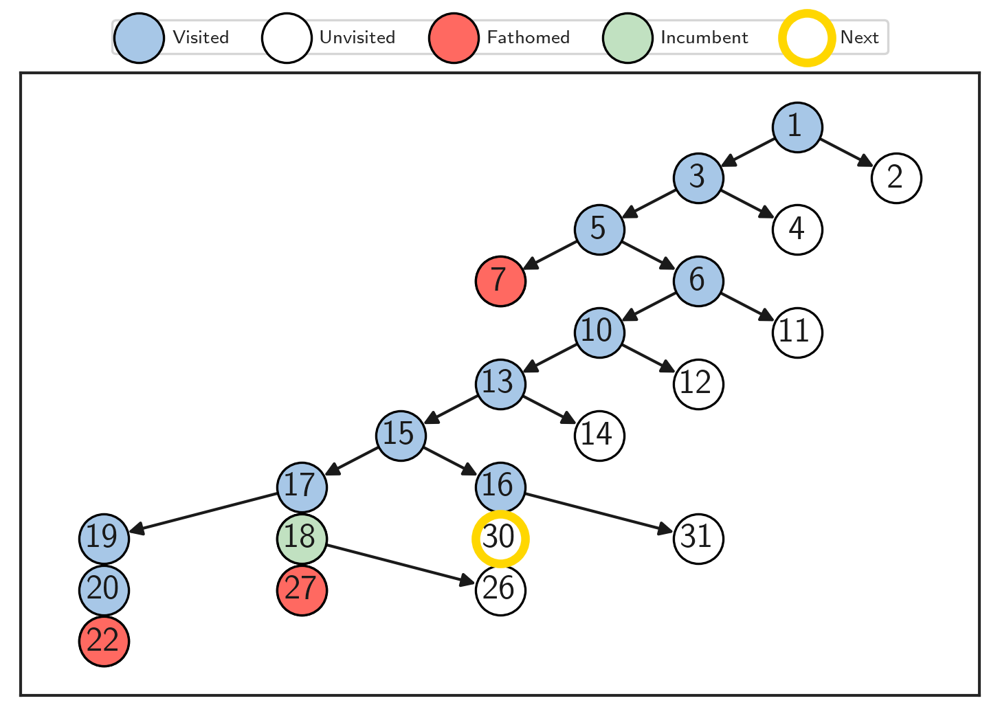


Step 15 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 30 | next_node_id (not yet branched at): 32 | optimum_node_id: 18
Custom reward: None
num groups: 5


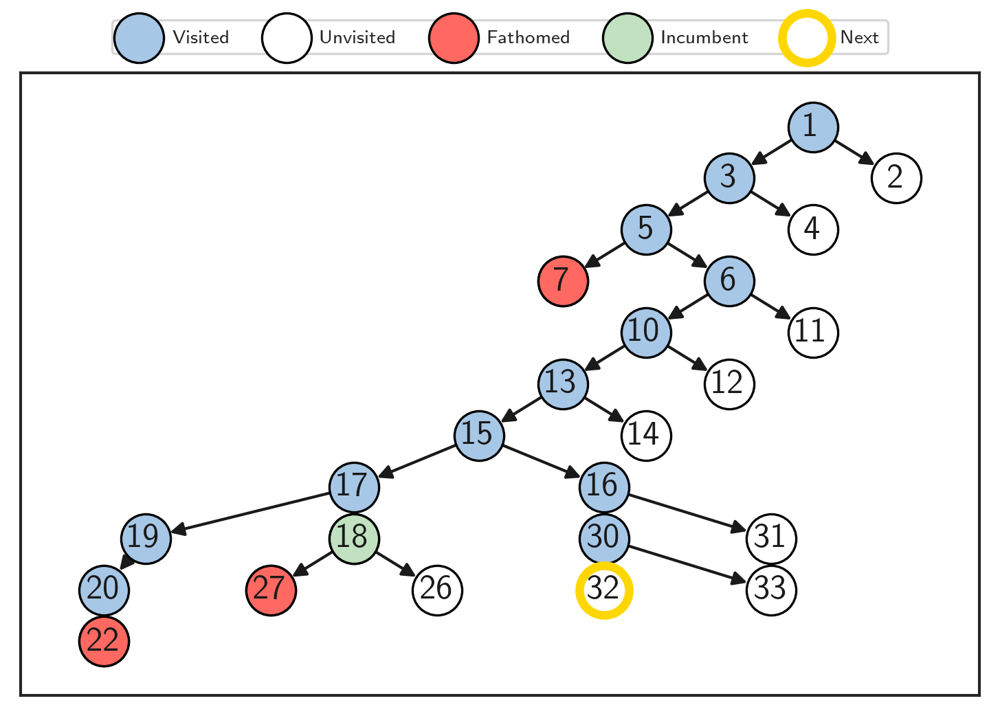


Step 16 | Nodes added: -5.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 32 | next_node_id (not yet branched at): 14 | optimum_node_id: 18
Custom reward: None
num groups: 5


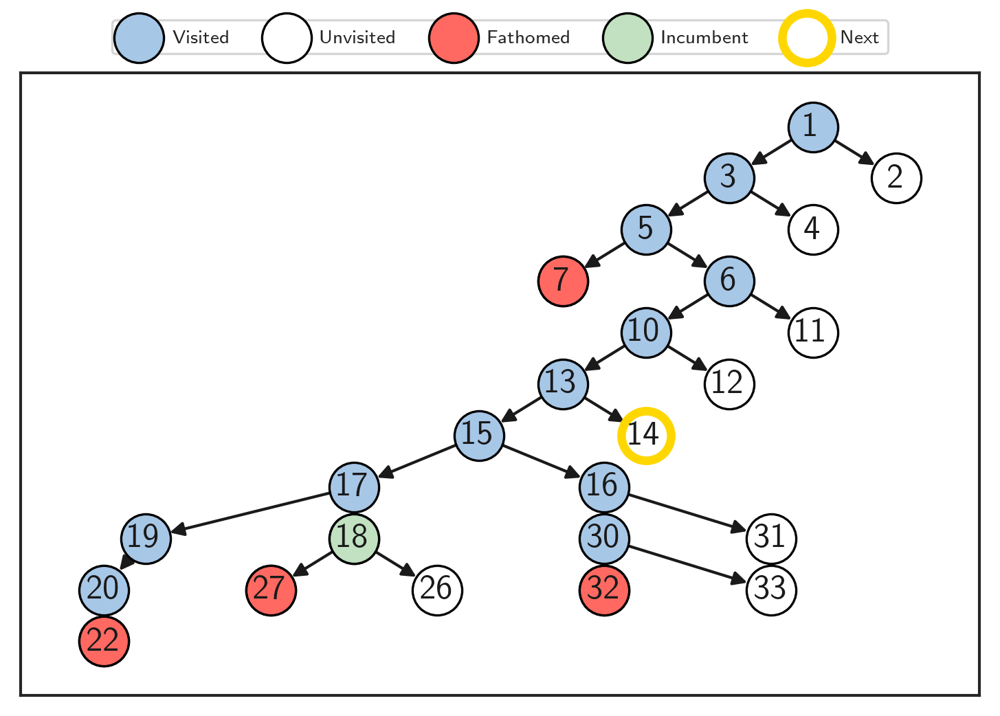


Step 17 | Nodes added: -3.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 14 | next_node_id (not yet branched at): 12 | optimum_node_id: 18
Custom reward: None
num groups: 5


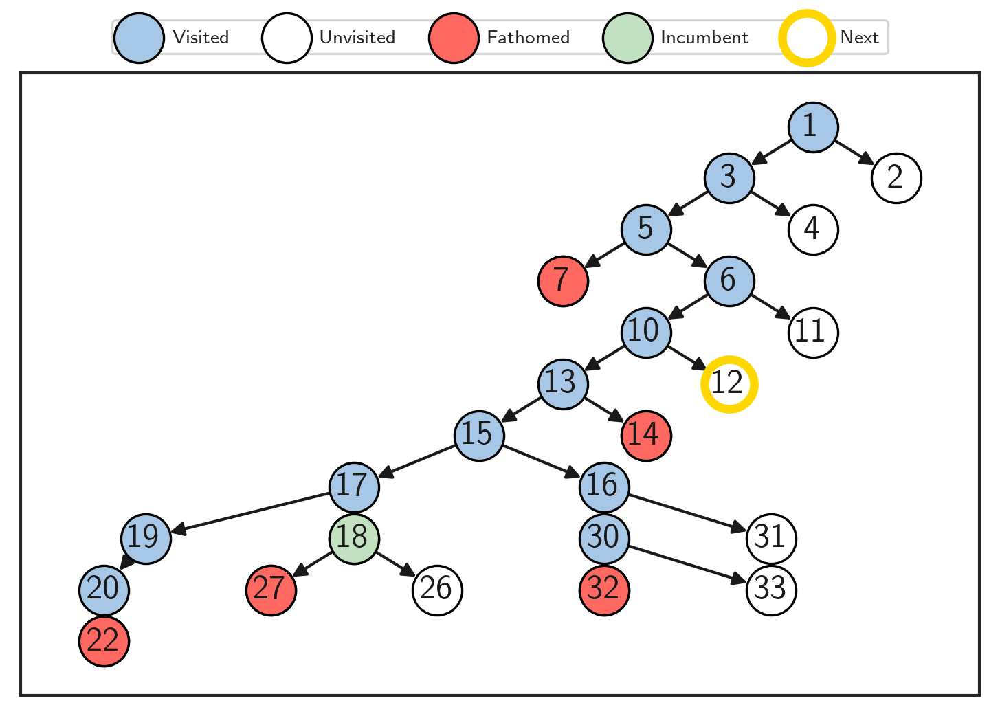


Step 18 | Nodes added: -4.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 12 | next_node_id (not yet branched at): 4 | optimum_node_id: 18
Custom reward: None
num groups: 5


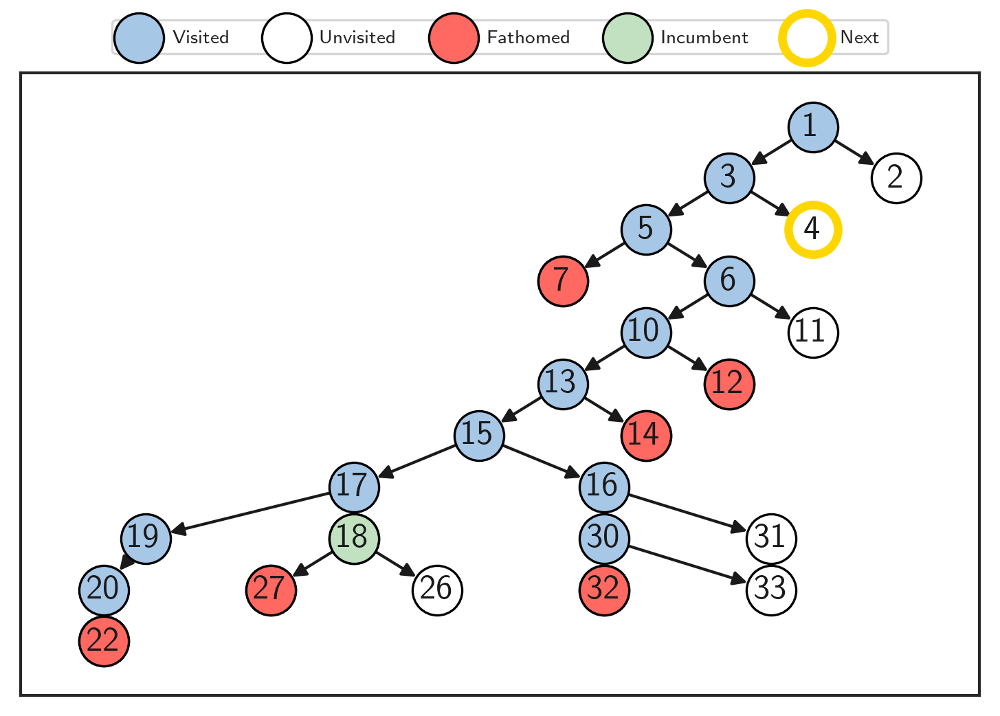


Step 19 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 4 | next_node_id (not yet branched at): 41 | optimum_node_id: 18
Custom reward: None
num groups: 5


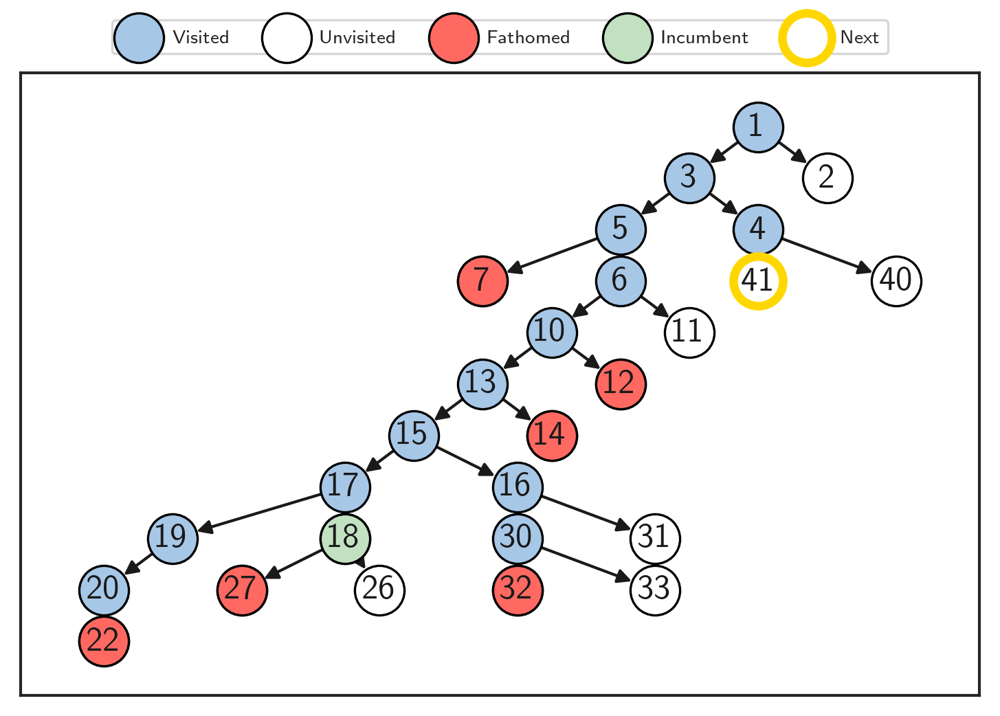


Step 20 | Nodes added: -2.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 41 | next_node_id (not yet branched at): 43 | optimum_node_id: 18
Custom reward: None
num groups: 5


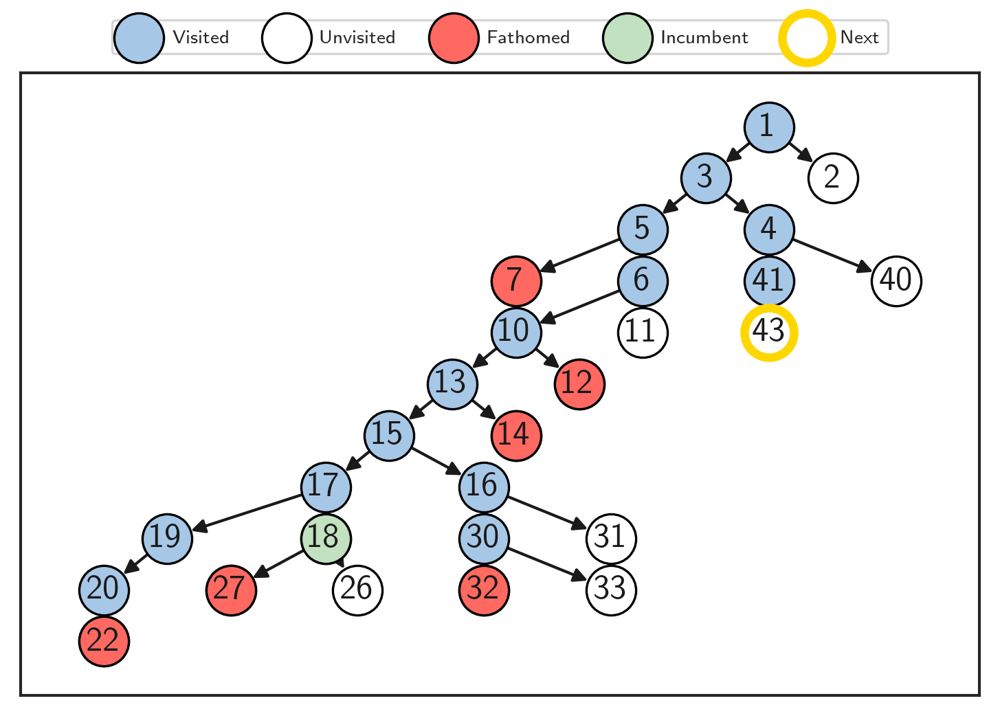


Step 21 | Nodes added: -3.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 43 | next_node_id (not yet branched at): 40 | optimum_node_id: 18
Custom reward: None
num groups: 5


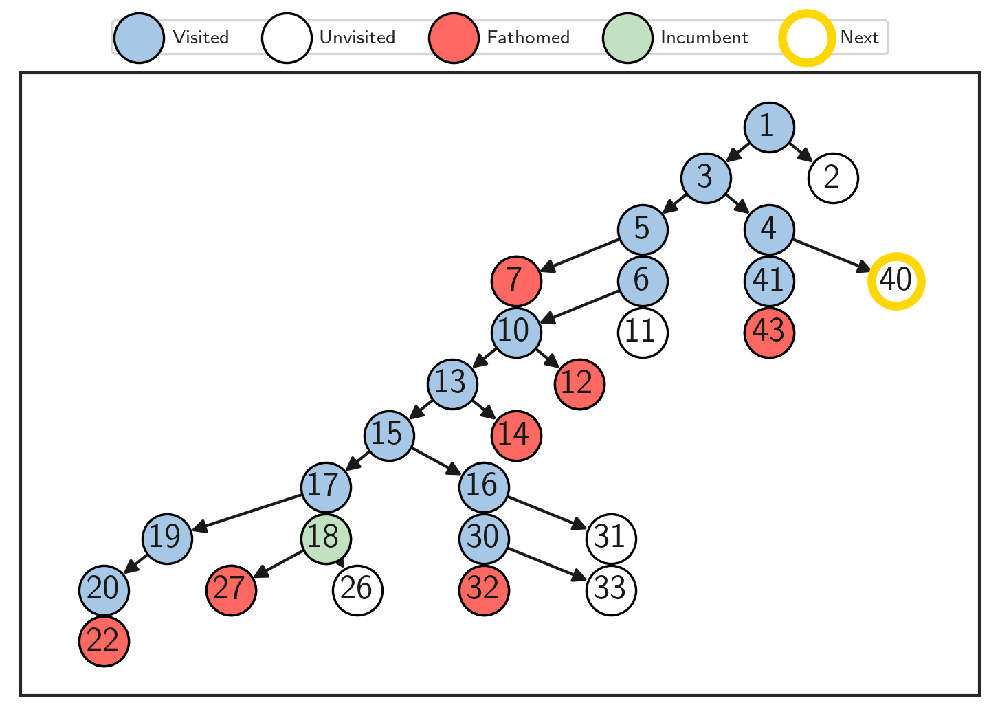


Step 22 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 40 | next_node_id (not yet branched at): 47 | optimum_node_id: 18
Custom reward: None
num groups: 5


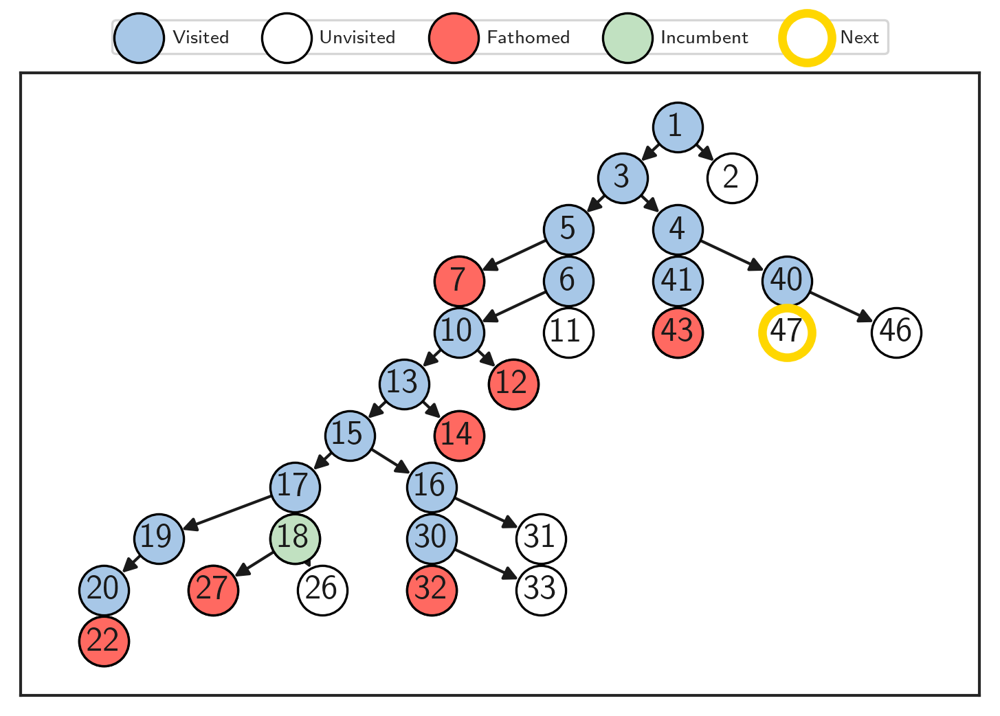


Step 23 | Nodes added: -3.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 47 | next_node_id (not yet branched at): 46 | optimum_node_id: 18
Custom reward: None
num groups: 5


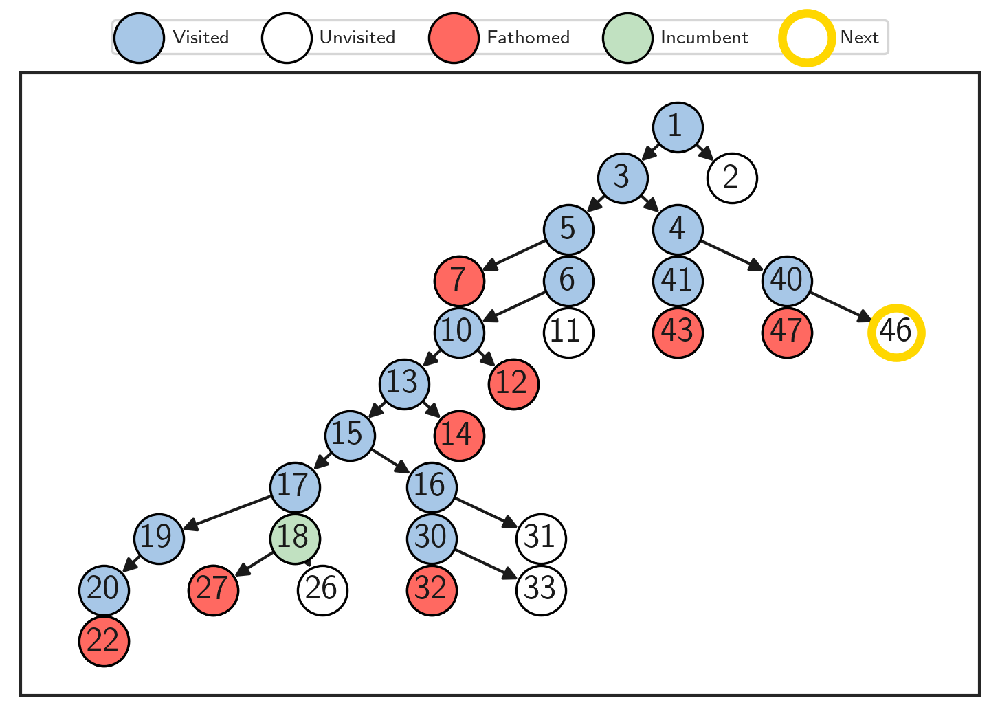


Step 24 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 46 | next_node_id (not yet branched at): 50 | optimum_node_id: 18
Custom reward: None
num groups: 5


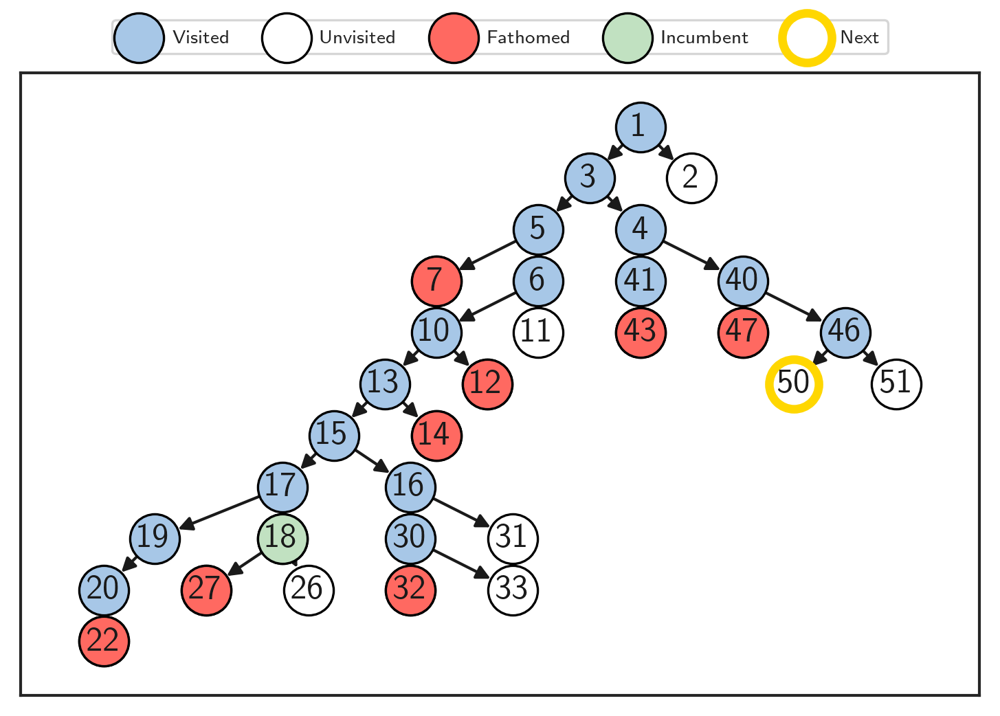


Step 25 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 50 | next_node_id (not yet branched at): 52 | optimum_node_id: 18
Custom reward: None
num groups: 5


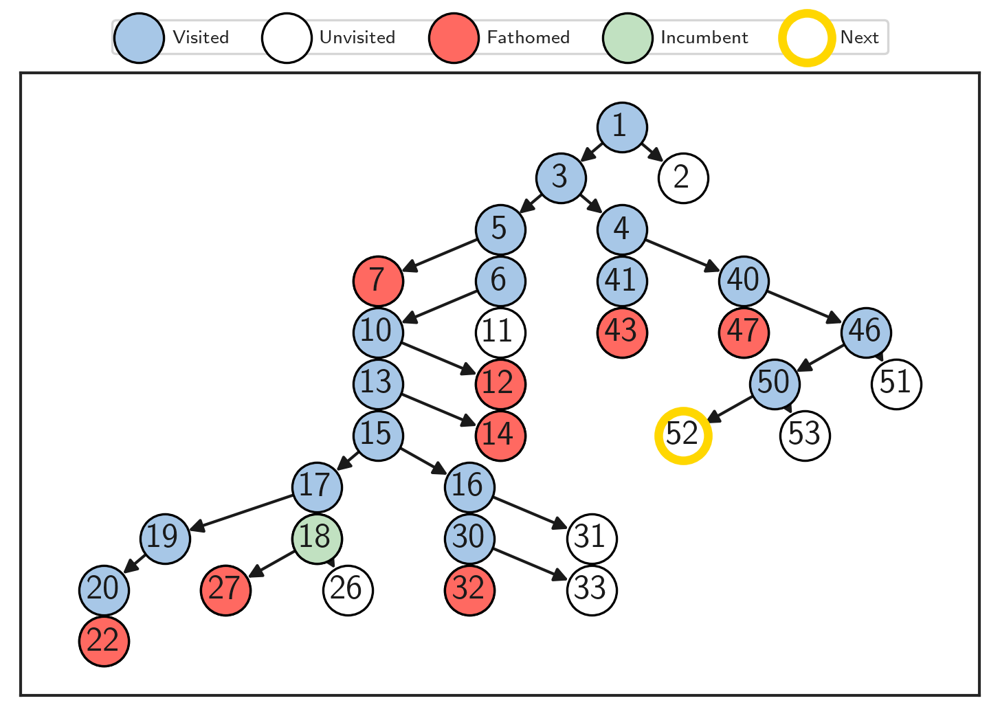


Step 26 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 52 | next_node_id (not yet branched at): 54 | optimum_node_id: 18
Custom reward: None
num groups: 5


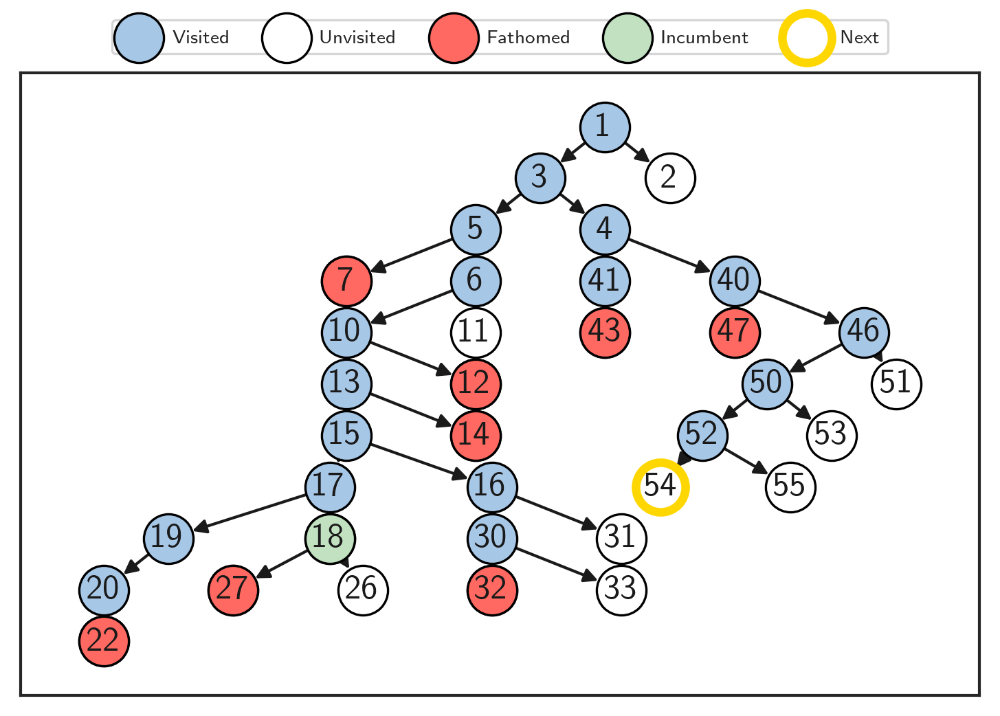


Step 27 | Nodes added: -5.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 54 | next_node_id (not yet branched at): 51 | optimum_node_id: 18
Custom reward: None
num groups: 5


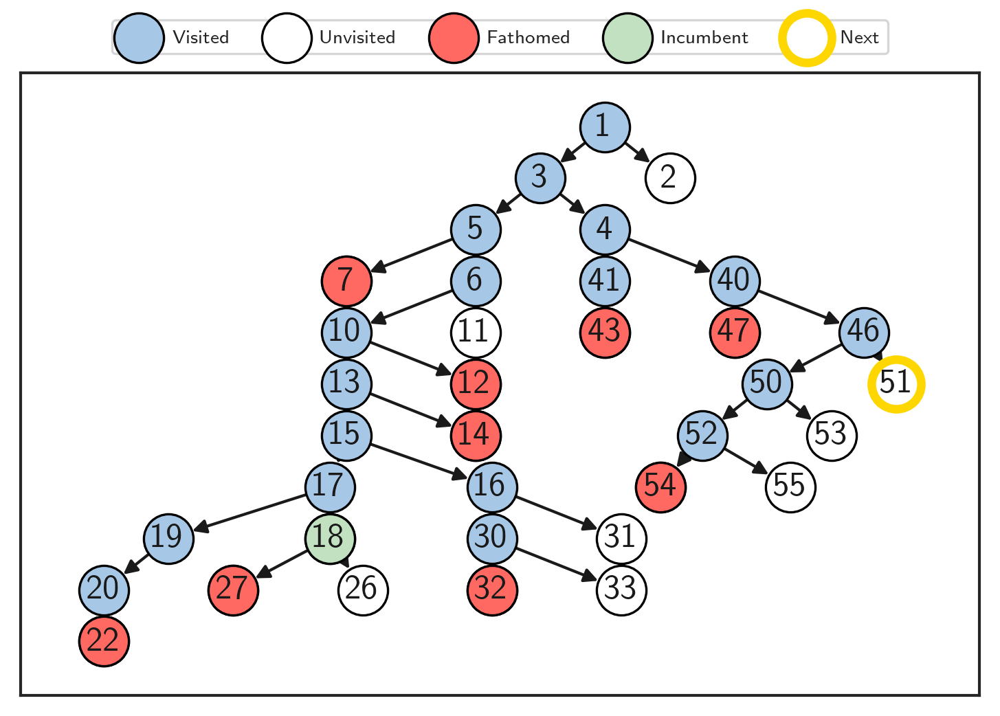


Step 28 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 51 | next_node_id (not yet branched at): 58 | optimum_node_id: 18
Custom reward: None
num groups: 5


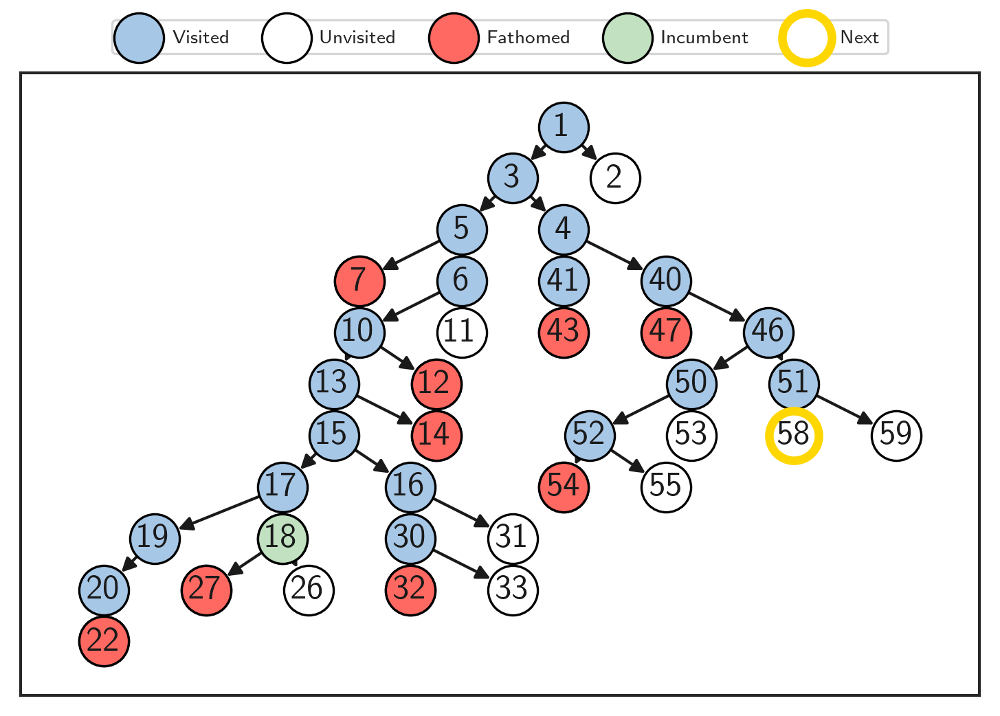


Step 29 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 58 | next_node_id (not yet branched at): 60 | optimum_node_id: 18
Custom reward: None
num groups: 5


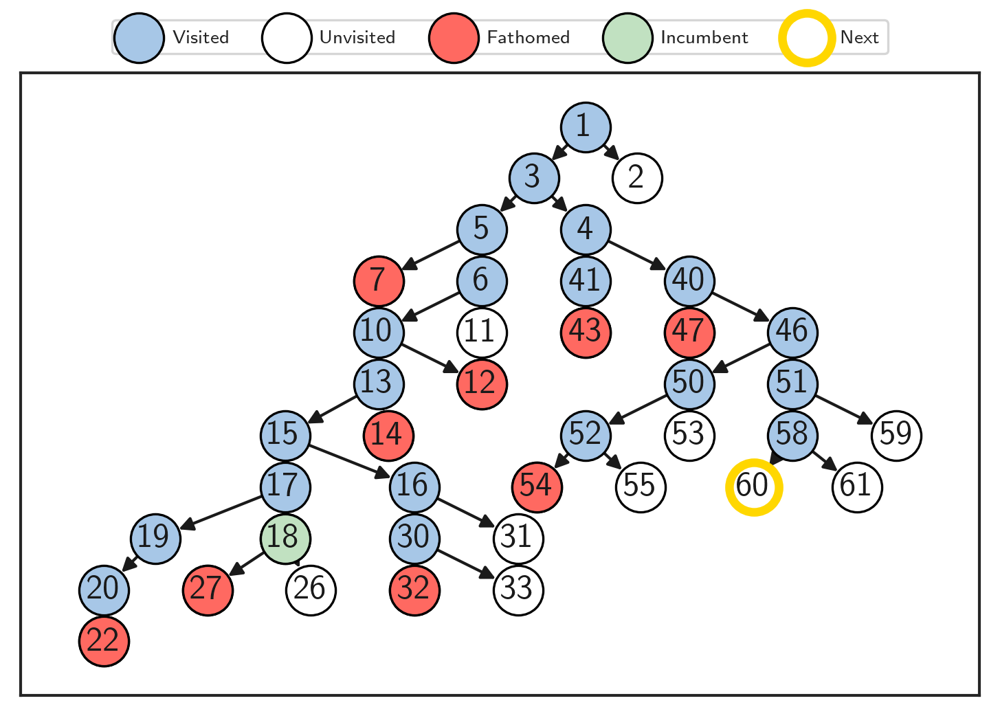


Step 30 | Nodes added: -3.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 60 | next_node_id (not yet branched at): 61 | optimum_node_id: 18
Custom reward: None
num groups: 5


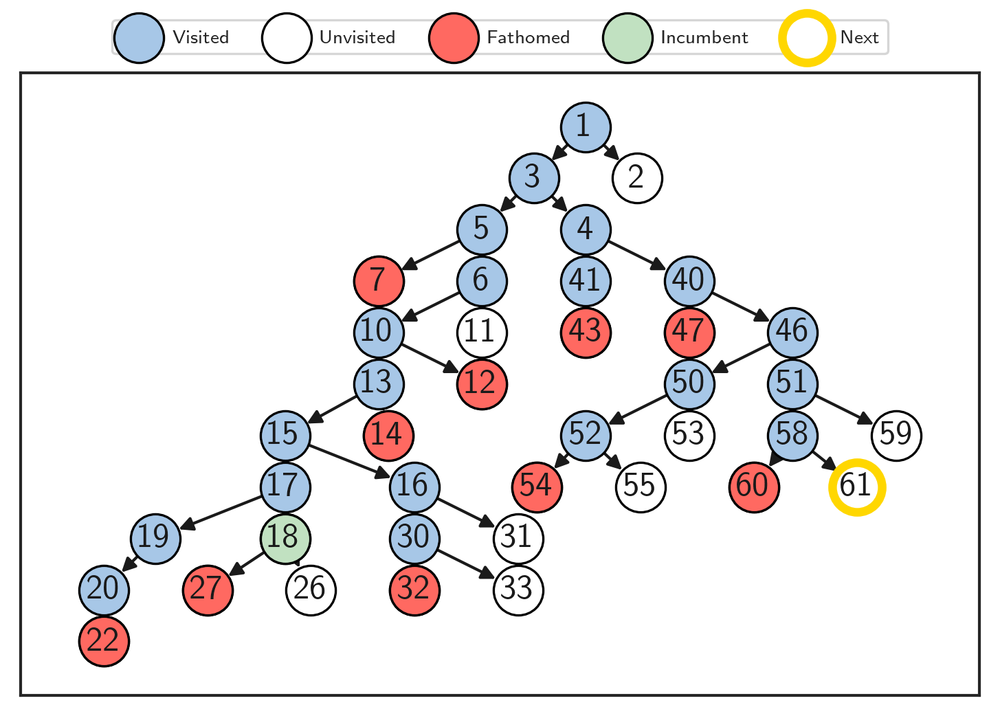


Step 31 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 477.64981344731876 | prev_node_id (branched at): 61 | next_node_id (not yet branched at): 64 | optimum_node_id: 18
Custom reward: None
num groups: 5


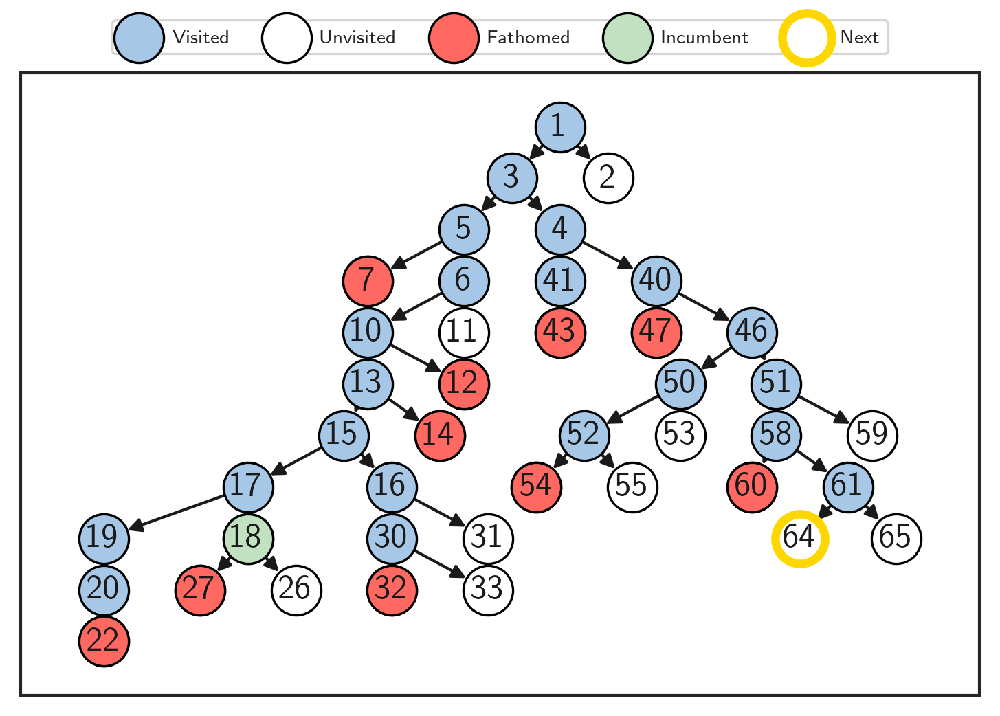


Step 32 | Nodes added: -5.000 | primal bound: 500.0 | dual bound: 486.5186687069625 | prev_node_id (branched at): 64 | next_node_id (not yet branched at): 2 | optimum_node_id: 18
Custom reward: None
num groups: 5


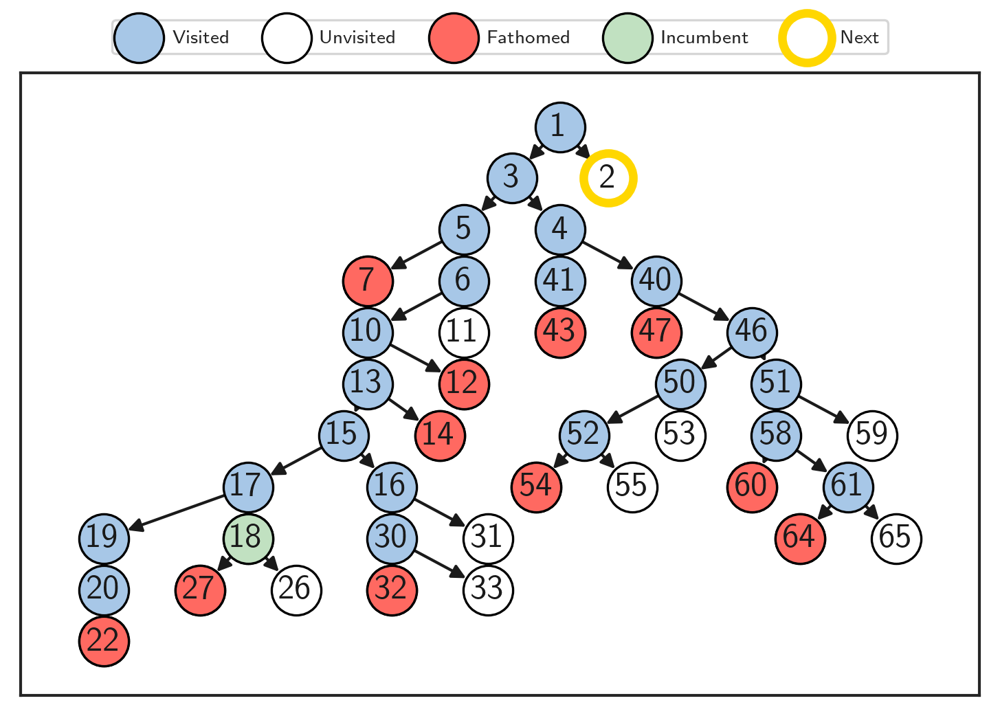


Step 33 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 486.5186687069625 | prev_node_id (branched at): 2 | next_node_id (not yet branched at): 69 | optimum_node_id: 18
Custom reward: None
num groups: 5


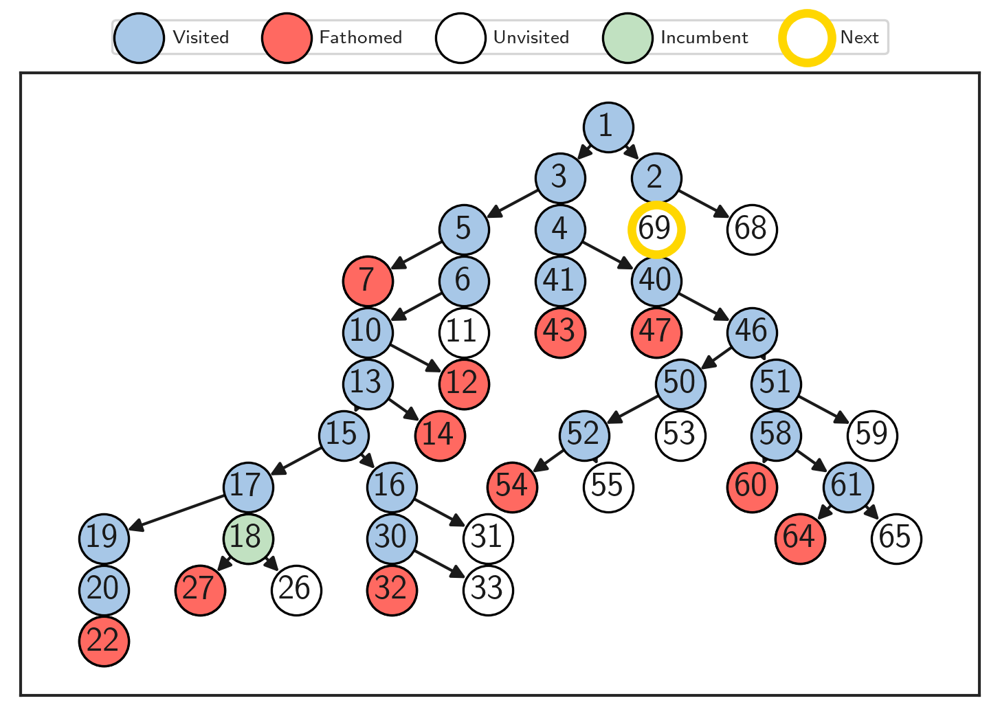


Step 34 | Nodes added: -2.000 | primal bound: 500.0 | dual bound: 486.5186687069625 | prev_node_id (branched at): 69 | next_node_id (not yet branched at): 70 | optimum_node_id: 18
Custom reward: None
num groups: 5


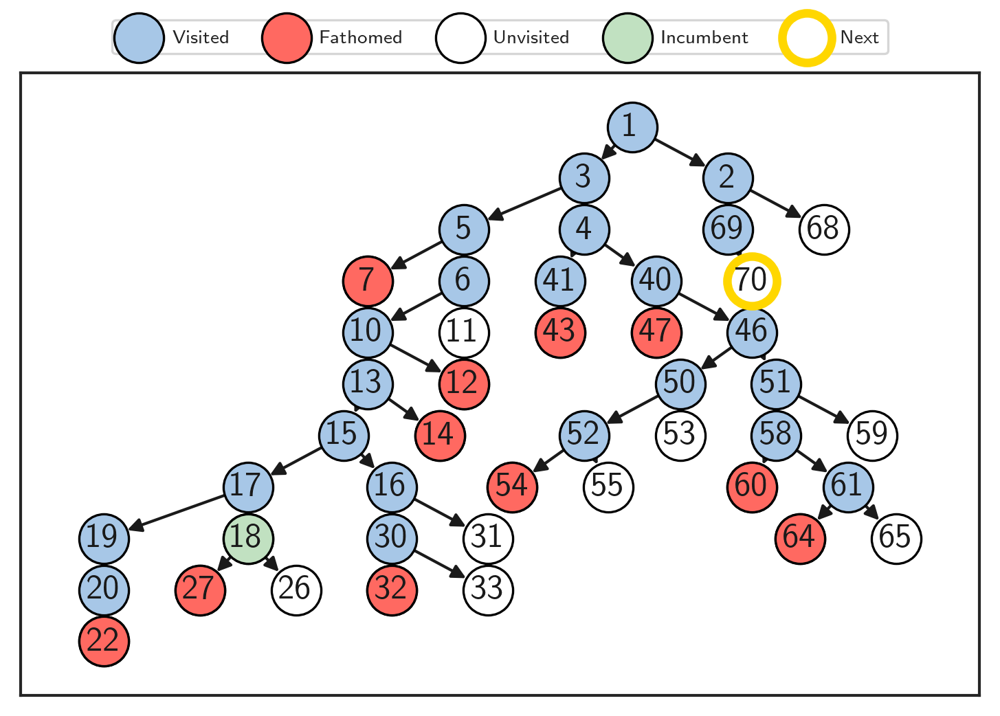


Step 35 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 486.5186687069625 | prev_node_id (branched at): 70 | next_node_id (not yet branched at): 72 | optimum_node_id: 18
Custom reward: None
num groups: 5


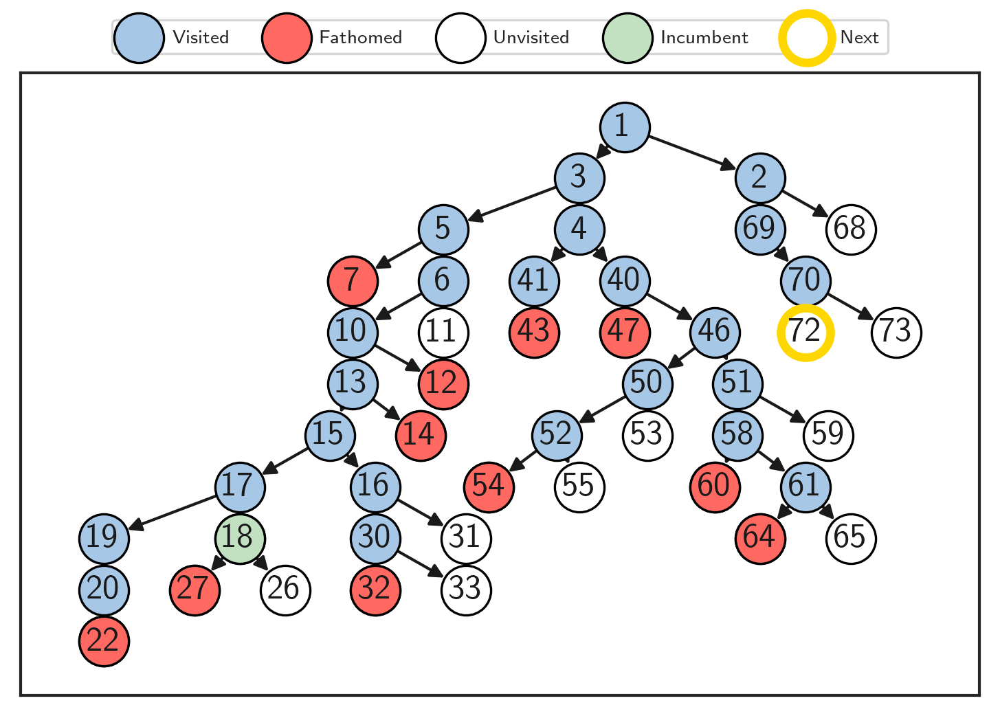


Step 36 | Nodes added: -3.000 | primal bound: 500.0 | dual bound: 486.5186687069625 | prev_node_id (branched at): 72 | next_node_id (not yet branched at): 73 | optimum_node_id: 18
Custom reward: None
num groups: 5


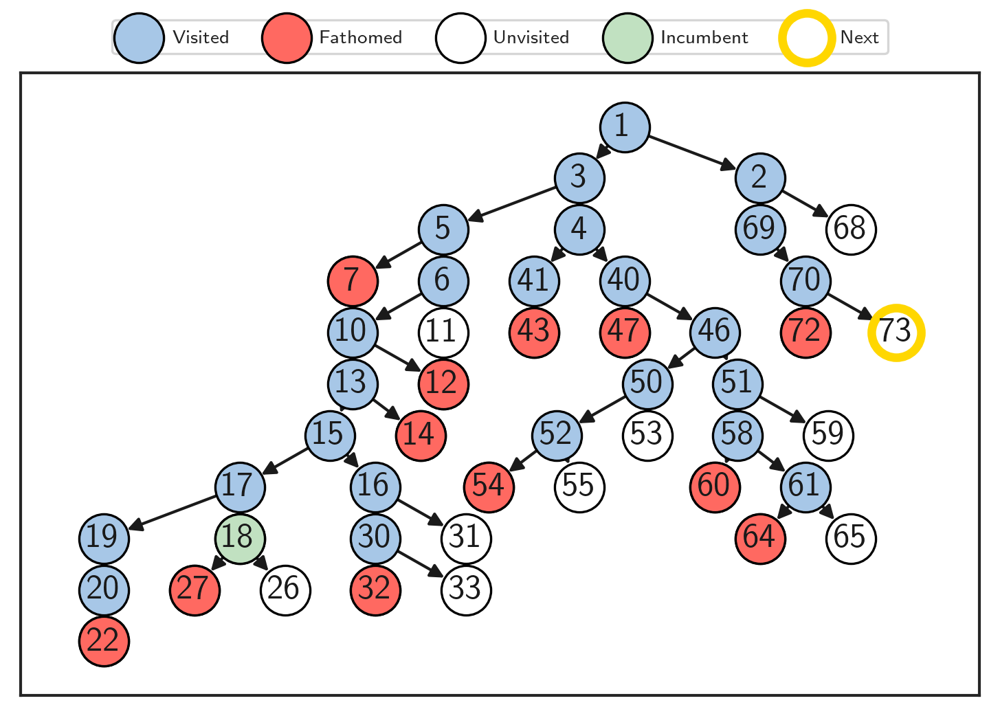


Step 37 | Nodes added: -2.000 | primal bound: 500.0 | dual bound: 486.5186687069625 | prev_node_id (branched at): 73 | next_node_id (not yet branched at): 76 | optimum_node_id: 18
Custom reward: None
num groups: 5


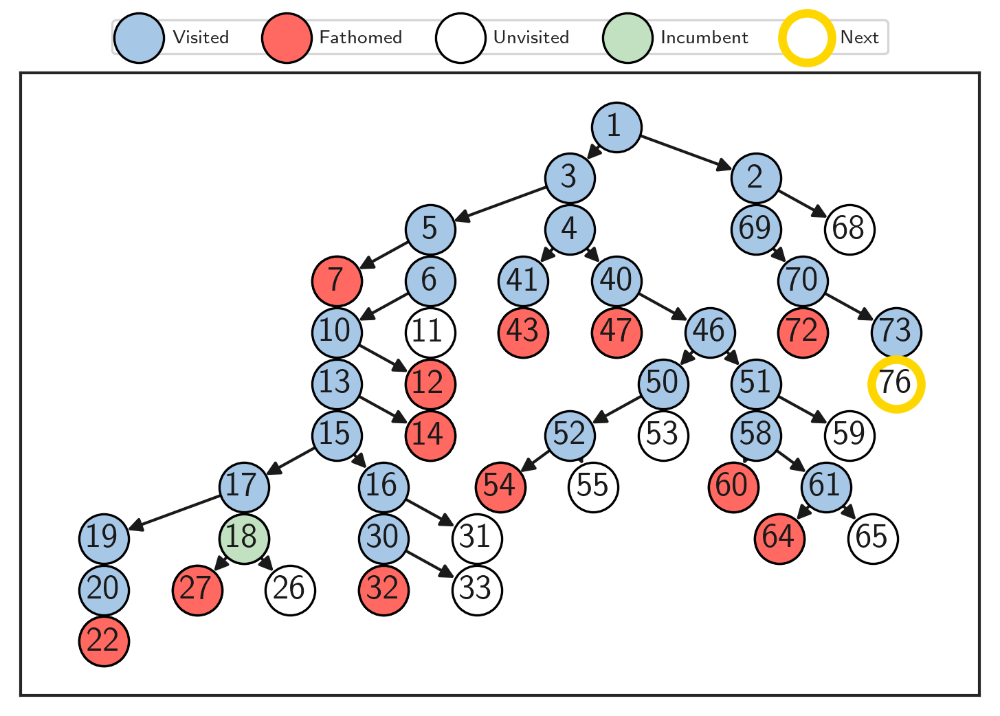


Step 38 | Nodes added: -2.000 | primal bound: 500.0 | dual bound: 486.5186687069625 | prev_node_id (branched at): 76 | next_node_id (not yet branched at): 79 | optimum_node_id: 18
Custom reward: None
num groups: 5


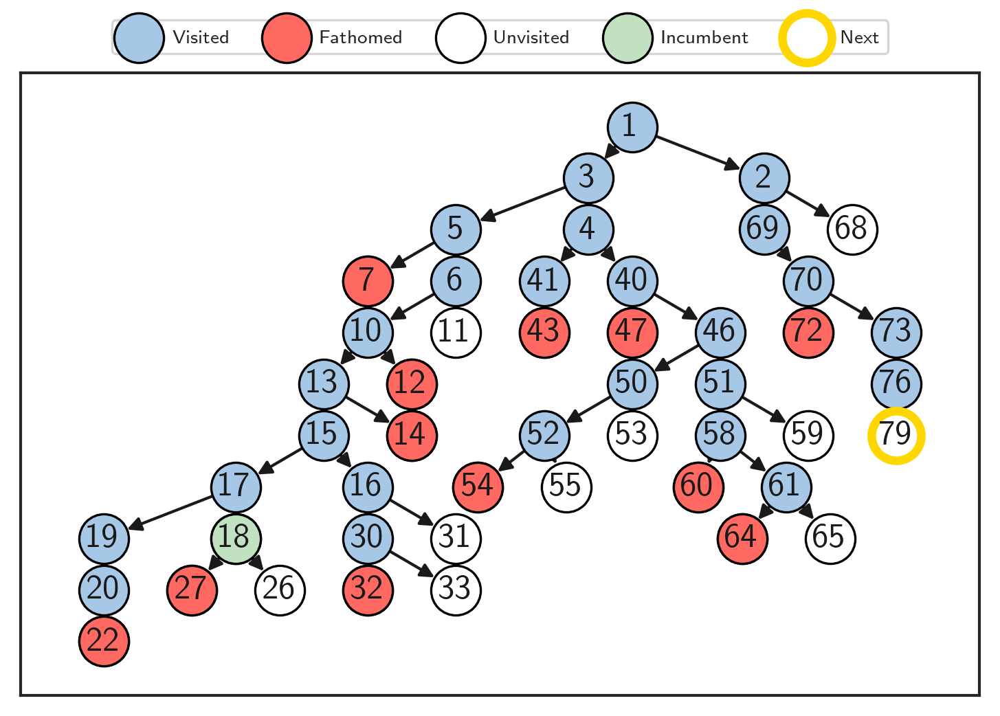


Step 39 | Nodes added: -2.000 | primal bound: 500.0 | dual bound: 486.5186687069625 | prev_node_id (branched at): 79 | next_node_id (not yet branched at): 80 | optimum_node_id: 18
Custom reward: None
num groups: 5


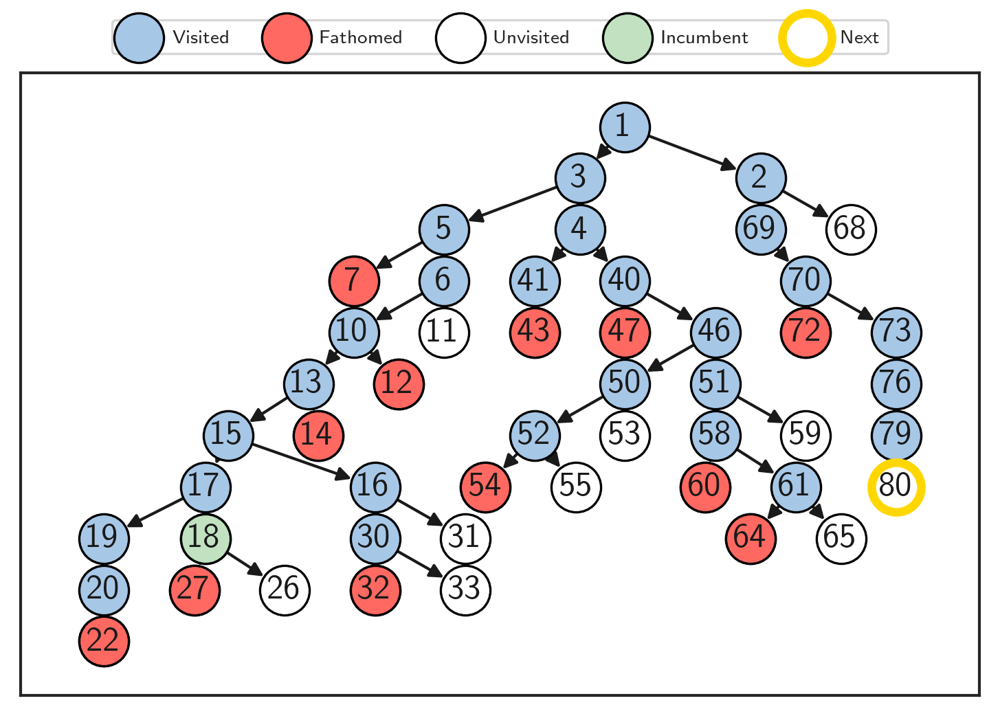


Step 40 | Nodes added: -3.000 | primal bound: 500.0 | dual bound: 490.55852156057495 | prev_node_id (branched at): 80 | next_node_id (not yet branched at): 68 | optimum_node_id: 18
Custom reward: None
num groups: 5


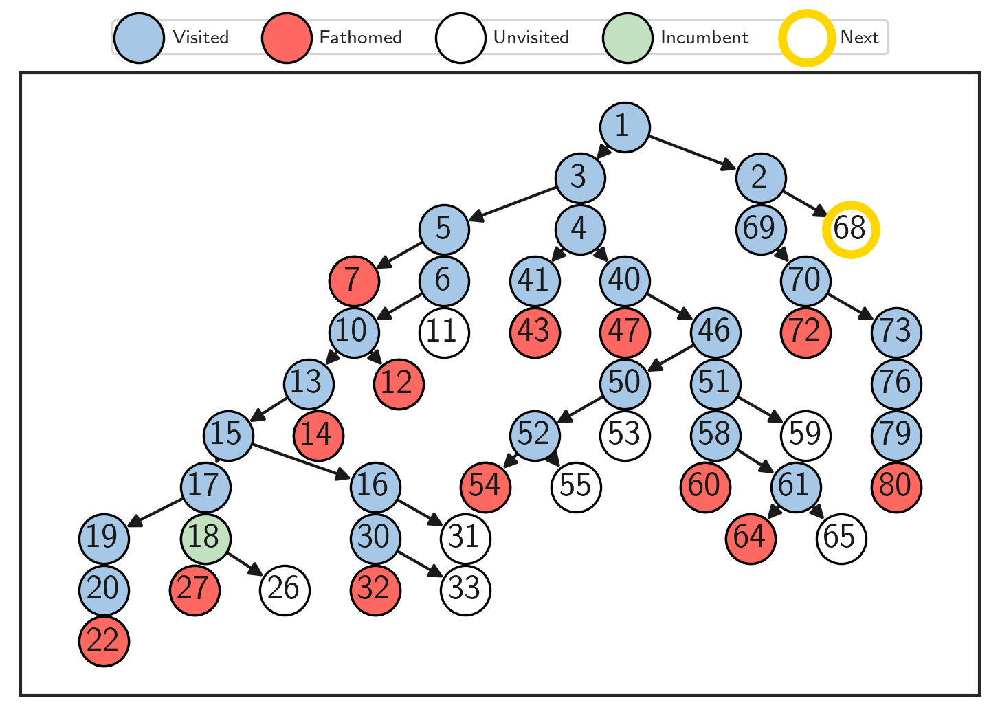


Step 41 | Nodes added: -2.000 | primal bound: 500.0 | dual bound: 493.80104712041884 | prev_node_id (branched at): 68 | next_node_id (not yet branched at): 84 | optimum_node_id: 18
Custom reward: None
num groups: 5


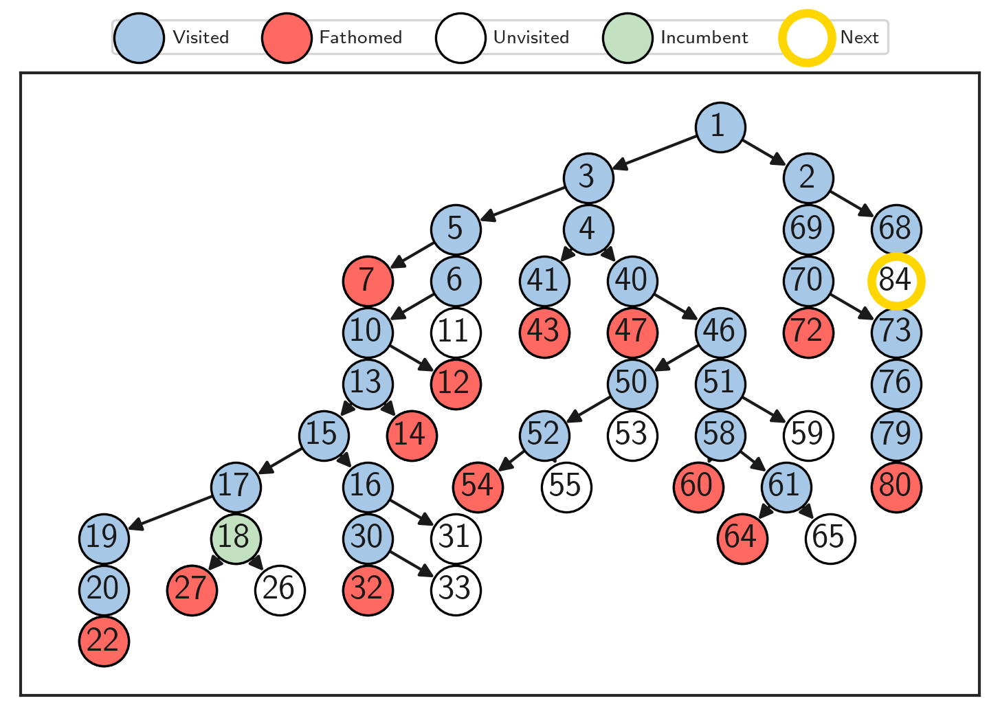


Step 42 | Nodes added: -2.000 | primal bound: 500.0 | dual bound: 494.9850746268657 | prev_node_id (branched at): 84 | next_node_id (not yet branched at): 86 | optimum_node_id: 18
Custom reward: None
num groups: 5


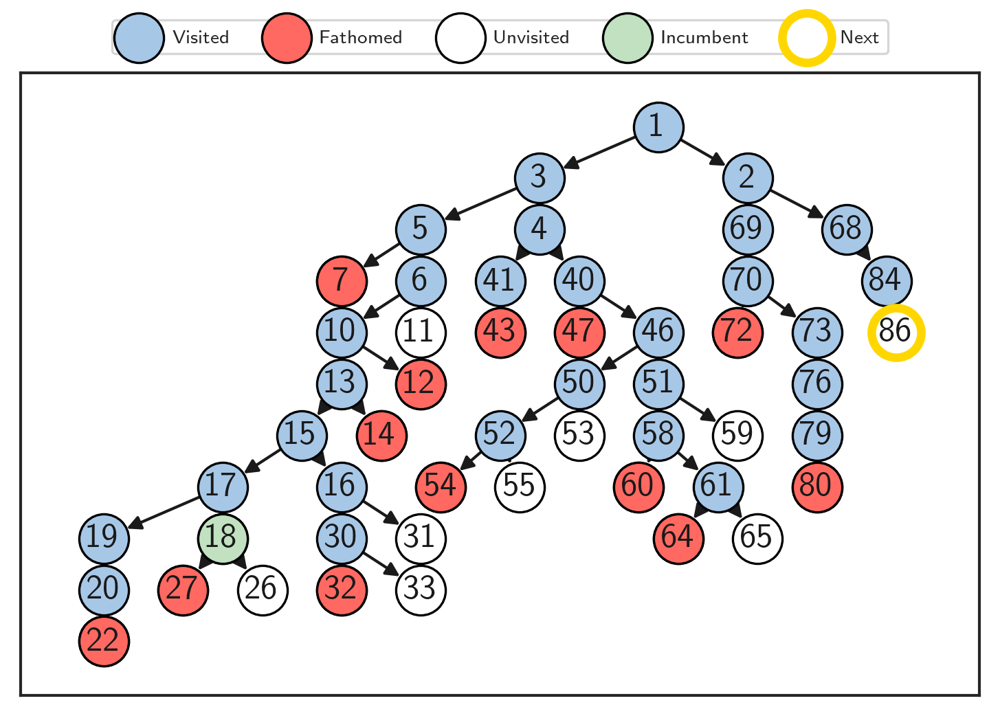


Step 43 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 494.9850746268657 | prev_node_id (branched at): 86 | next_node_id (not yet branched at): 89 | optimum_node_id: 18
Custom reward: None
num groups: 5


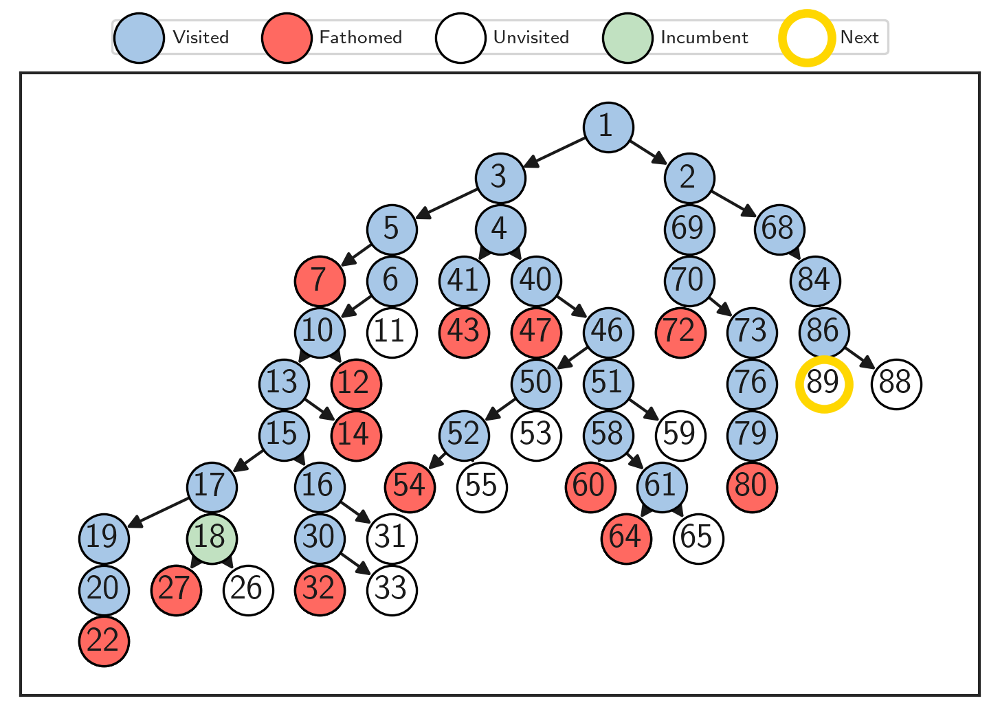


Step 44 | Nodes added: -2.000 | primal bound: 500.0 | dual bound: 494.9850746268657 | prev_node_id (branched at): 89 | next_node_id (not yet branched at): 91 | optimum_node_id: 18
Custom reward: None
num groups: 5


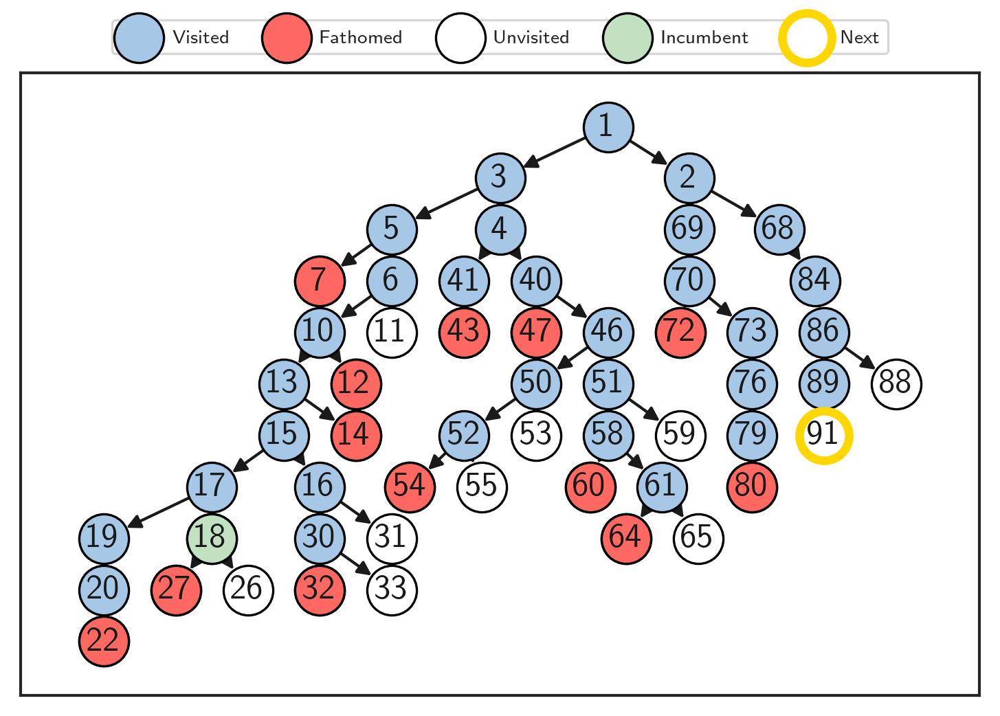


Step 45 | Nodes added: -1.000 | primal bound: 500.0 | dual bound: 494.9850746268657 | prev_node_id (branched at): 91 | next_node_id (not yet branched at): 93 | optimum_node_id: 18
Custom reward: None
num groups: 5


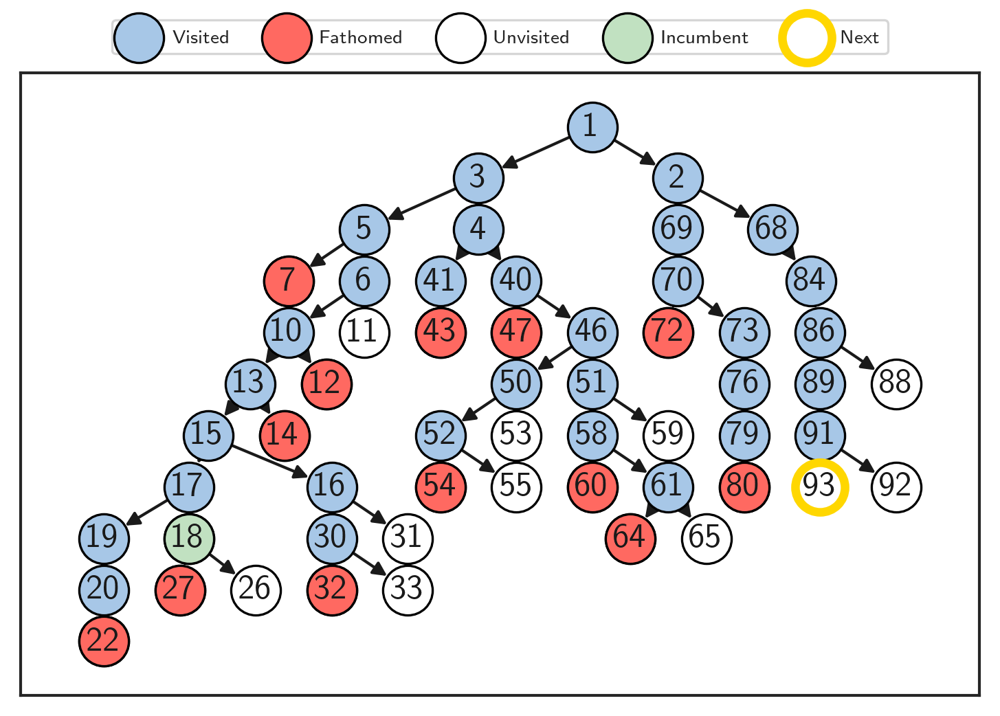


Step 46 | Nodes added: -4.000 | primal bound: 500.0 | dual bound: 496.9718309859155 | prev_node_id (branched at): 93 | next_node_id (not yet branched at): 88 | optimum_node_id: 18
Custom reward: None
num groups: 5


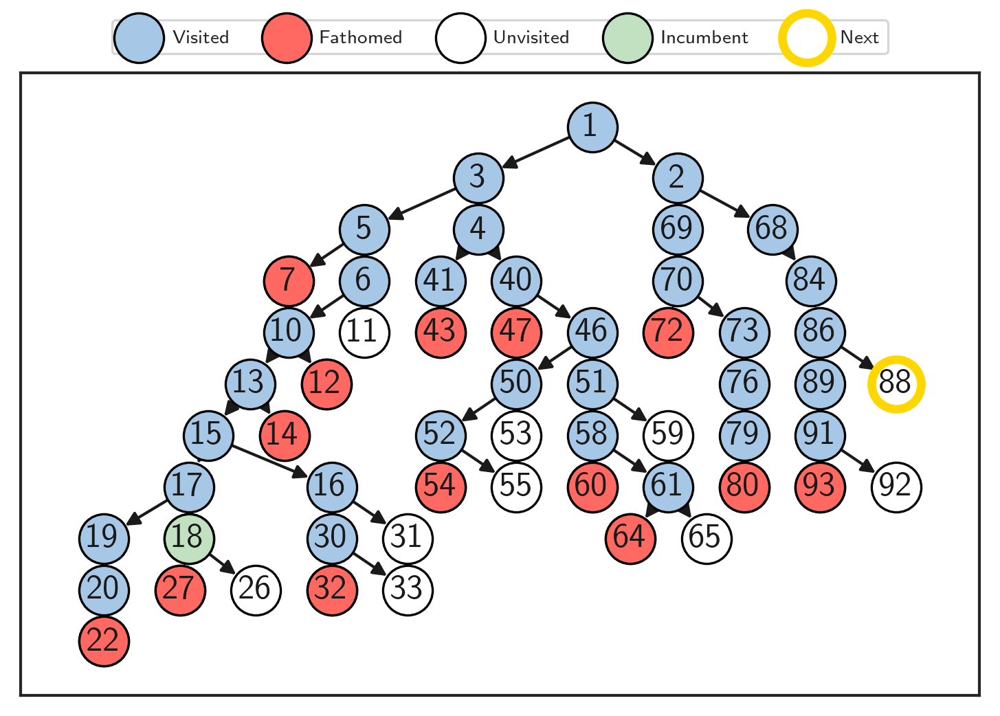


Step 47 | Nodes added: -2.000 | primal bound: 500.0 | dual bound: 497.47457627118644 | prev_node_id (branched at): 88 | next_node_id (not yet branched at): 96 | optimum_node_id: 18
Custom reward: None
num groups: 5


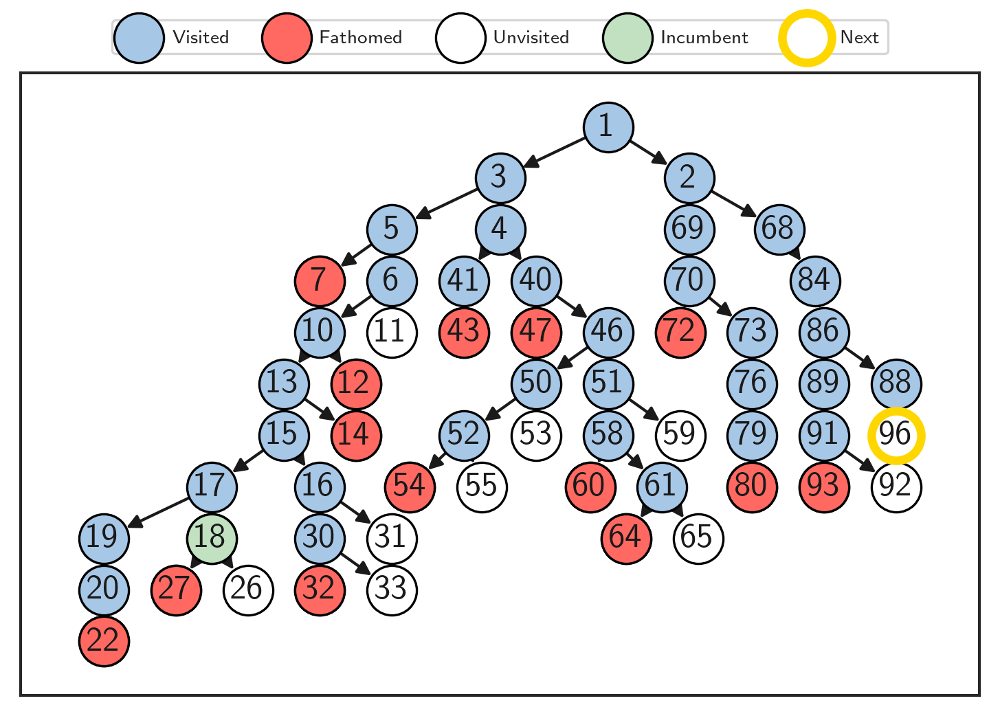


Step 48 | Nodes added: -2.000 | primal bound: 500.0 | dual bound: 498.098814229249 | prev_node_id (branched at): 96 | next_node_id (not yet branched at): 99 | optimum_node_id: 18
Custom reward: None
num groups: 5


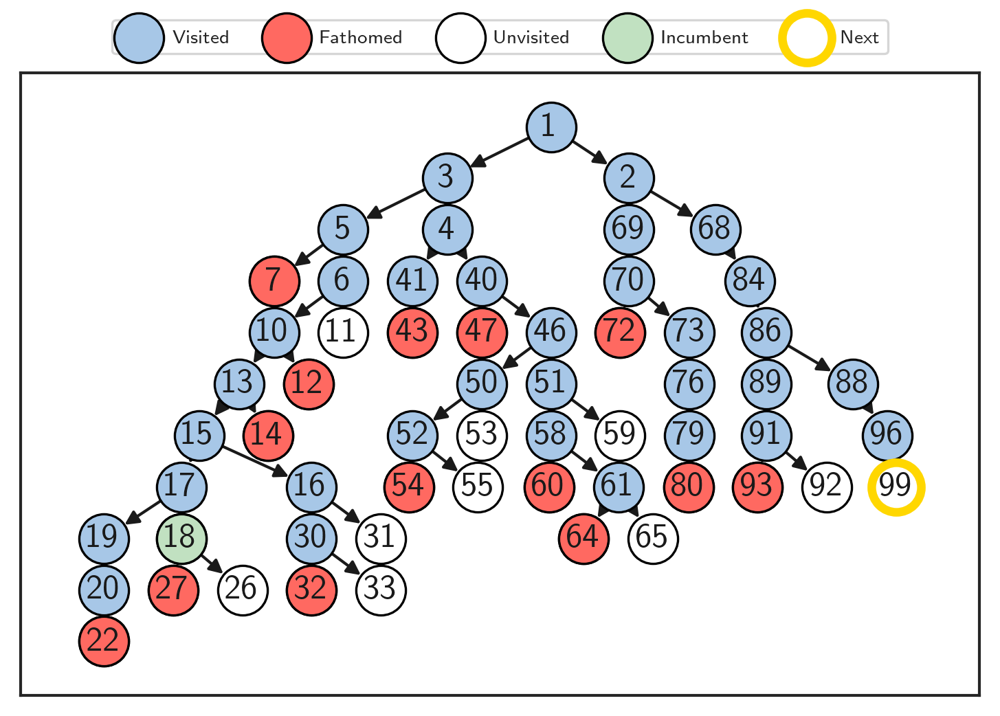



B&B tree:
All nodes saved: [1, 3, 2, 5, 4, 7, 6, 10, 11, 13, 12, 15, 14, 17, 16, 19, 18, 20, 22, 27, 26, 30, 31, 32, 33, 41, 40, 43, 47, 46, 50, 51, 52, 53, 54, 55, 58, 59, 60, 61, 64, 65, 69, 68, 70, 72, 73, 76, 79, 80, 84, 86, 89, 88, 91, 93, 92, 96, 99]
Visited nodes: OrderedSet([1, 3, 5, 7, 6, 10, 13, 15, 17, 19, 20, 22, 18, 27, 16, 30, 32, 14, 12, 4, 41, 43, 40, 47, 46, 50, 52, 54, 51, 58, 60, 61, 64, 2, 69, 70, 72, 73, 76, 79, 80, 68, 84, 86, 89, 91, 93, 88, 96, 99])
num groups: 4


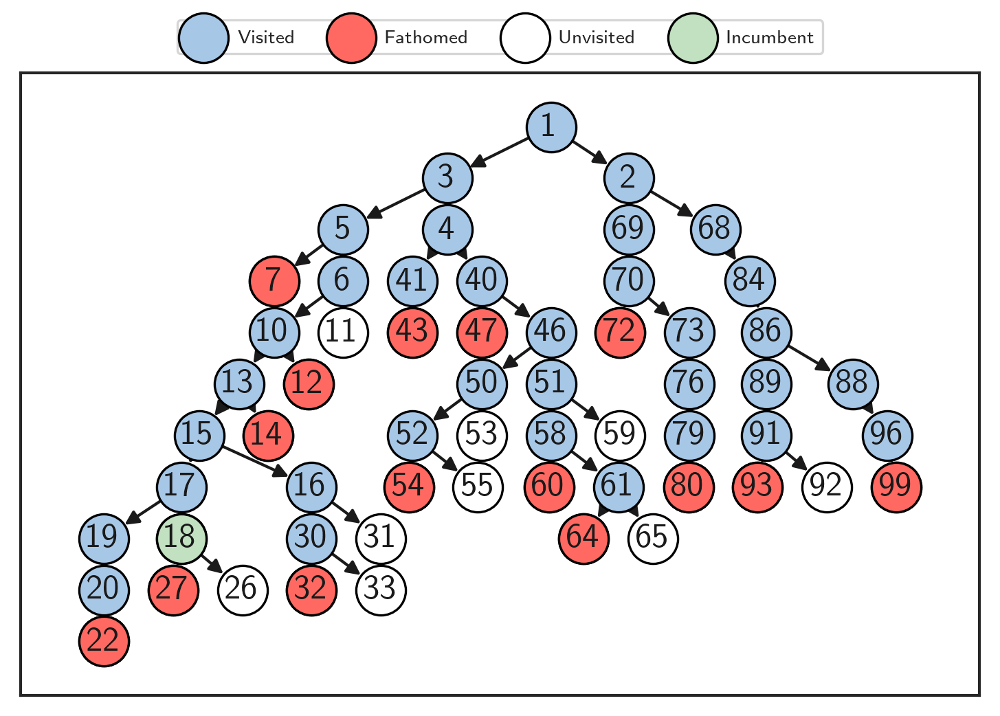

visited_nodes_to_step_idx: {1: 0, 3: 1, 5: 2, 7: 3, 6: 4, 10: 5, 13: 6, 15: 7, 17: 8, 19: 9, 20: 10, 22: 11, 18: 12, 27: 13, 16: 14, 30: 15, 32: 16, 14: 17, 12: 18, 4: 19, 41: 20, 43: 21, 40: 22, 47: 23, 46: 24, 50: 25, 52: 26, 54: 27, 51: 28, 58: 29, 60: 30, 61: 31, 64: 32, 2: 33, 69: 34, 70: 35, 72: 36, 73: 37, 76: 38, 79: 39, 80: 40, 68: 41, 84: 42, 86: 43, 89: 44, 91: 45, 93: 46, 88: 47, 96: 48, 99: 49}
step_idx_to_visited_nodes: {0: 1, 1: 3, 2: 5, 3: 7, 4: 6, 5: 10, 6: 13, 7: 15, 8: 17, 9: 19, 10: 20, 11: 22, 12: 18, 13: 27, 14: 16, 15: 30, 16: 32, 17: 14, 18: 12, 19: 4, 20: 41, 21: 43, 22: 40, 23: 47, 24: 46, 25: 50, 26: 52, 27: 54, 28: 51, 29: 58, 30: 60, 31: 61, 32: 64, 33: 2, 34: 69, 35: 70, 36: 72, 37: 73, 38: 76, 39: 79, 40: 80, 41: 68, 42: 84, 43: 86, 44: 89, 45: 91, 46: 93, 47: 88, 48: 96, 49: 99}
>>> sub-tree episode 1: {0: 0, 1: 0, 2: 0, 3: -4}
path: [1, 3, 5, 7]
ep_dual_bounds: [477.64981344731876, 479.9553152692606, 486.4130434782608, 500.2437810945274]
>>> sub-tree ep

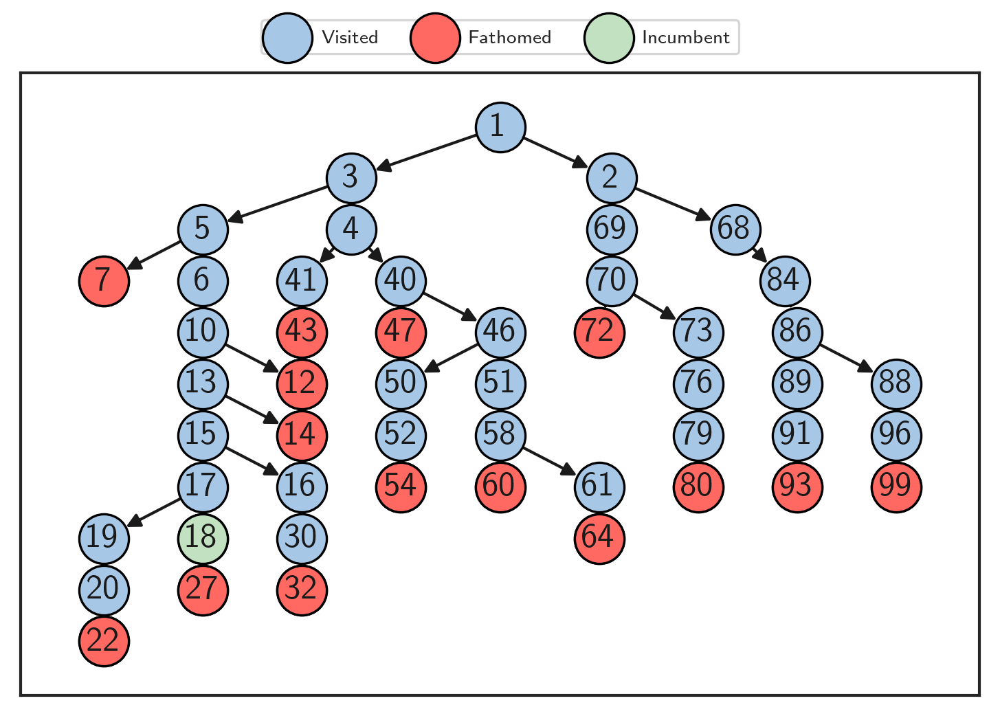



Finished | primal bound: 500.0 | dual bound: 500.0 | # nodes: 100 | Final node: {99: <pyscipopt.scip.Node object at 0x7f3d94164b90>} | Optimum node id: 18
SCIP NTotalNodes: 100
Custom reward: [{0: 0, 1: 0, 2: 0, 3: -4}, {33: 0, 34: 0, 35: 0, 36: -4}, {19: 0, 20: 0, 21: -3}, {4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0, 11: -8}, {41: 0, 42: 0, 43: 0, 44: 0, 45: 0, 46: -6}, {22: 0, 23: -2}, {18: -1}, {17: -1}, {14: 0, 15: 0, 16: -3}, {12: 0, 13: -2}, {37: 0, 38: 0, 39: 0, 40: -4}, {24: 0, 25: 0, 26: 0, 27: -4}, {47: 0, 48: 0, 49: -3}, {28: 0, 29: 0, 30: -3}, {31: 0, 32: -2}]
num groups: 3


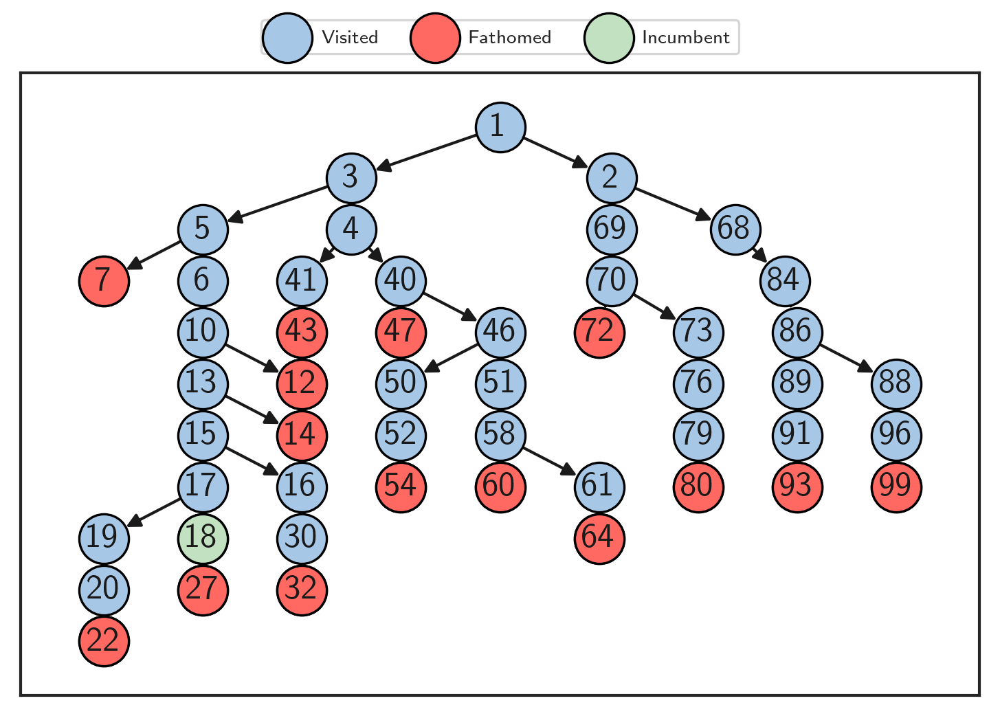

In [266]:
%autoreload

custom_reward = RetroBranching(only_return_optimal_trajectory=False,
                                         force_include_optimal_trajectory=False,
                                         force_include_branching_fathomed_transitions=True,
                                         only_use_leaves_closed_by_brancher_as_terminal_nodes=True,
                                         set_score_as_subtree_size=False,
                                         set_terminal_node_score_as_retrospective_subtree_size=True,
                                         use_binary_sparse_rewards=True,
                                         normaliser='init_primal_bound', 
                                         min_subtree_depth=1, 
                                         retro_trajectory_construction='visitation_order', # max_leaf_lp_gain shortest 
                                         remove_nonoptimal_fathomed_leaves=False,
                                         transform_with_log=False,
                                         debug_mode=True)

done = True
while done:
    env.seed(seed)
    instance = next(instances)
    custom_reward.before_reset(instance)
    agent.before_reset(instance)
    obs, action_set, reward, done, info = env.reset(instance)
    _custom_reward = custom_reward.extract(env.model, done)
    
t = 0
instance_transitions = []
prev_obs = copy.deepcopy(obs)
tree = custom_reward.normalised_lp_gain.tree
# tree = SearchTree(env.model)
tree.render()
while not done:
    # select branching action
    action, action_idx = agent.action_select(action_set, model=env.model, done=done)
    obs, action_set, reward, done, info = env.step(action)
    _custom_reward = custom_reward.extract(env.model, done)
    
    if done:
        obs = copy.deepcopy(prev_obs)
    
    # store transition
    instance_transitions.append({'obs': prev_obs,
                               'action': action,
#                                'reward': reward['normalised_lp_gain'],
                               'reward': reward['num_nodes'],
                               'done': done,
                               'next_obs': obs})
    
    # update prev obs
    prev_obs = copy.deepcopy(obs)
    
    m = env.model.as_pyscipopt()
    if len(tree.tree.graph['visited_node_ids']) > 1 and not done:
        prev_node_id = tree.tree.graph['visited_node_ids'][-2]
    else:
        prev_node_id = tree.tree.graph['visited_node_ids'][-1]
    curr_node_id = tree.curr_node_id
    print(f'Step {t} | Nodes added: {reward["num_nodes"]:.3f} | primal bound: {m.getPrimalbound()} | dual bound: {m.getDualbound()} | prev_node_id (branched at): {prev_node_id} | next_node_id (not yet branched at): {curr_node_id} | optimum_node_id: {tree.tree.graph["optimum_node_ids"][-1]}')
    print(f'Custom reward: {_custom_reward}')
    
    # update search tree and analyse branching action
    tree.update_tree(env.model)
    tree.render()
    
    print('')
    
    t += 1
        
m = env.model.as_pyscipopt()
print(f'\nFinished | primal bound: {m.getPrimalbound()} | dual bound: {m.getDualbound()} | # nodes: {m.getNTotalNodes()} | Final node: {tree.tree.graph["visited_nodes"][-1]} | Optimum node id: {tree.tree.graph["optimum_node_ids"][-1]}')
print(f'SCIP NTotalNodes: {env.model.as_pyscipopt().getNTotalNodes()}')
print(f'Custom reward: {_custom_reward}')
tree.render()